# Allstate Claims Severity

<h1>1.Business/Real-world Problem</h1>

<h2>1.1. What is Allstate Claims? </h2>

<p>
The Allstate Corporation is an American-based insurance company. Allstate's slogan "You're in good hands" was created in the 1950s by Allstate Insurance Company's sales executive, Davis W. Ellis based on a similar phrase he used to reassure his wife about a doctor caring for their child. It has been the slogan ever since 1950. Allstate also referred to themselves as the Good Hands People. <br> 
Source: https://www.allstate.com/claims.aspx
<p>

<h2> 1.2. Problem Statement </h2>

**Problem Statement**

When you’ve been devastated by a serious car accident, your focus is on the things that matter the most: family, friends, and other loved ones. Pushing paper with your insurance agent is the last place you want your time or mental energy spent. This is why Allstate, a personal insurer in the United States, is continually seeking fresh ideas to improve their claims service for the over 16 million households they protect.

**Why we need Machine Learning Solution**

The goal of this challenge is to build a model that can help Allstate to predict the server of the claims accuratly. At the same time, to provide the important factors that have strong impact on the severity. With these information, Allstate can proposed or adjust more suitable insurance packages for their customers.

Where we have a large data is not easy to analysis manually and predict the cost / loss for a claim. Sometimes it might lead to overpayment which is loss for a company, mainly in finance sector.So, by making use of machine learning techniques we can predict the mimimum loss and focus on important factors.


<h2>1.3 Source/Useful Links </h2>

<p>    When you’ve been devastated by a serious car accident, your focus is on the things that matter the most: family, friends, and other loved ones. Pushing paper with your insurance agent is the last place you want your time or mental energy spent. This is why Allstate, a personal insurer in the United States, is continually seeking fresh ideas to improve their claims service for the over 16 million households they protect.

Allstate is currently developing automated methods of predicting the cost, and hence severity, of claims. In this recruitment challenge, Kagglers are invited to show off their creativity and flex their technical chops by creating an algorithm which accurately predicts claims severity. Aspiring competitors will demonstrate insight into better ways to predict claims severity for the chance to be part of Allstate’s efforts to ensure a worry-free customer experience.
<br>
<br>
This dataset provided by Allstate team contains only categorical and continuous features.
,</p>
<p>
<b> Source: </b> https://www.kaggle.com/c/allstate-claims-severity
</p>

<h2>1.4. Real-world/Business objectives and constraints.</h2>


1. Minimize mean absolute error (MAE)
2. Calculating the cliam insurance should not take much time but sometimes it may take few minutes. 

**Why MAE , why not other regression metrices.**

The goal of this project is to predict the cost of
insurance claims in order to help improve insurance
claim severity analysis and provide better targeted
assistance to customers.

Allstate is currently developing automated methods of predicting the cost, and hence severity, of claims.

For predicting the cost , we need to know the amount, which is real number that can be claimed in insurance policy. So, we can't use Rsquared or Adjuested Rsquared. 

When we use mean absolute error, as MEAN is not prone outliers ( high claims ) , there might be chance of predicitng high amount for a small injury / small claims.This might bring loss to a company. 

*   Mean squared error ( considering magnitude , + /- )
*   Mean squared logarithmic error
*   Mean absolute error ( without considering magnitude , L1 norm loss )
*   Variance score { The best possible score is 1.0, lower values are worse }
*   RMAE ( SquareRoot Mean / Median Absolute Error )
*   R-Squared

All the above leads to target value manipulation as they won't predict the exact loss. 

So, Using **Median absolut error** , is not very sensitive to outliers ( high claims ) we can predict the exact / near by loss to company. 

<h1>2. Machine Learning Problem</h1>

<h2>2.1. Data</h2>

<h3>2.1.1. Data Overview</h3>

<li> Source : https://www.kaggle.com/c/allstate-claims-severity/data </li>

    
<li>Total train dataset consist of 66.7MB data  </li>
<li><b>The data is anonymous </b> </li>

<li>There are total 132 observations, 116 out of 132 are categorical and remaining are numerical </li>

<li>Each categorical features have different classes { A to Z , AA - ZZ}</li>

<h2>2.2. Mapping the real-world problem to an ML problem</h2>

<h3>2.2.1. Type of Machine Learning Problem</h3>

<p>
    
The goal of this project is to predict the cost of insurance claims in order to help improve insurance claim severity analysis and provide better targeted assistance to customers.

As target variable is continuous , we can build a regression models.
</p>

<h3>2.2.2. Performance Metric</h3>

Source: https://www.kaggle.com/c/allstate-claims-severity/overview/evaluation

Metric(s): 
* mean absolute error (MAE)


<h3>2.2.3. Machine Learing Objectives and Constraints</h3>

<p> Objective:  Predict the cost of insurance claims </p>
<p> Constraints:</p>
* Some Latency constraints.

<h2>2.3. Train and Test Dataset </h2>

In this case we have test data is provided by AllCalims team. 
Split the train dataset randomly into two parts train and cross validation with K-fold cross validation ( like 4-fold , 6-fold }

<h2>2.4. Useful blogs, videos and reference papers</h2>

<p>
https://medium.com/kaggle-blog/allstate-claims-severity-competition-2nd-place-winners-interview-alexey-noskov-f4e4ce18fcfc <br>
http://cs229.stanford.edu/proj2017/final-reports/5242012.pdf <br>
https://nycdatascience.com/blog/student-works/machine-learning/kaggle-competition-allstate-claims-severity/ <br>
https://notendur.hi.is/heh89/Allstate_Claims_Severity.pdf <br>
https://www.kaggle.com/tilii7/bias-correction-xgboost<br>
https://www.kaggle.com/sharmasanthosh/exploratory-study-on-ml-algorithms <br>
2nd winner solution youtube : https://www.youtube.com/watch?v=5fBGkoDTrsc <br>
" Cross validation is more trustworthy than domain knowledge." 
</p>

<h1>3. Exploratory Data Analysis</h1>

In [4]:
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression,Ridge,Lasso,ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor,BaggingRegressor,ExtraTreesRegressor,AdaBoostRegressor,GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from scipy.stats import skew,boxcox

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
%cd /content/drive/My Drive/Applied AI Course/Assignments/23. Self Case Study 1

/content/drive/My Drive/Applied AI Course/Assignments/23. Self Case Study 1


In [5]:
"""
Reading Train and Test data
"""
Train_Data = pd.read_csv('train.csv')
Test_Data = pd.read_csv('test.csv')

<h2>3.1. Distribution of data </h2>

In [ ]:
Train_Data.head()

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,...,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
0,1,A,B,A,B,A,A,A,A,B,A,B,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,...,A,D,B,C,E,A,C,T,B,G,A,A,I,E,G,J,G,BU,BC,C,AS,S,A,O,LB,0.726300,0.245921,0.187583,0.789639,0.310061,0.718367,0.335060,0.30260,0.67135,0.83510,0.569745,0.594646,0.822493,0.714843,2213.18
1,2,A,B,A,A,A,A,A,A,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,...,A,D,D,C,E,E,D,T,L,F,A,A,E,E,I,K,K,BI,CQ,A,AV,BM,A,O,DP,0.330514,0.737068,0.592681,0.614134,0.885834,0.438917,0.436585,0.60087,0.35127,0.43919,0.338312,0.366307,0.611431,0.304496,1283.60
2,5,A,B,A,A,B,A,A,A,B,B,B,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,...,A,D,D,C,E,E,A,D,L,O,A,B,E,F,H,F,A,AB,DK,A,C,AF,A,I,GK,0.261841,0.358319,0.484196,0.236924,0.397069,0.289648,0.315545,0.27320,0.26076,0.32446,0.381398,0.373424,0.195709,0.774425,3005.09
3,10,B,B,A,B,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,...,A,D,D,C,E,E,D,T,I,D,A,A,E,E,I,K,K,BI,CS,C,N,AE,A,O,DJ,0.321594,0.555782,0.527991,0.373816,0.422268,0.440945,0.391128,0.31796,0.32128,0.44467,0.327915,0.321570,0.605077,0.602642,939.85
4,11,A,B,A,B,A,A,A,A,B,B,A,B,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,...,H,D,B,D,E,E,A,P,F,J,A,A,D,E,K,G,B,H,C,C,Y,BM,A,K,CK,0.273204,0.159990,0.527991,0.473202,0.704268,0.178193,0.247408,0.24564,0.22089,0.21230,0.204687,0.202213,0.246011,0.432606,2763.85


In [ ]:
Test_Data.head()

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,...,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14
0,4,A,B,A,A,A,A,A,A,B,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,...,A,A,D,C,C,E,C,D,T,H,G,A,A,G,E,I,L,K,BI,BC,A,J,AX,A,Q,HG,0.321594,0.299102,0.246911,0.402922,0.281143,0.466591,0.317681,0.61229,0.34365,0.38016,0.377724,0.369858,0.704052,0.392562
1,6,A,B,A,B,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,...,A,A,D,D,D,E,A,A,P,B,D,A,A,G,G,G,F,B,BI,CO,E,G,X,A,L,HK,0.634734,0.620805,0.654310,0.946616,0.836443,0.482425,0.443760,0.71330,0.51890,0.60401,0.689039,0.675759,0.453468,0.208045
2,9,A,B,A,B,B,A,B,A,B,B,A,B,B,B,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,B,A,B,B,...,A,A,D,D,C,E,E,A,D,G,Q,A,D,D,E,J,G,A,BI,CS,C,U,AE,A,K,CK,0.290813,0.737068,0.711159,0.412789,0.718531,0.212308,0.325779,0.29758,0.34365,0.30529,0.245410,0.241676,0.258586,0.297232
3,12,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,B,A,...,G,H,D,D,C,E,E,D,T,G,A,A,D,E,E,I,K,K,BI,CR,A,AY,AJ,A,P,DJ,0.268622,0.681761,0.592681,0.354893,0.397069,0.369930,0.342355,0.40028,0.33237,0.31480,0.348867,0.341872,0.592264,0.555955
4,15,B,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,...,A,A,D,B,D,E,A,A,P,A,A,A,A,F,E,G,E,B,AB,EG,A,E,I,C,J,HA,0.553846,0.299102,0.263570,0.696873,0.302678,0.398862,0.391833,0.23688,0.43731,0.50556,0.359572,0.352251,0.301535,0.825823


Given data have only Cat and Con and no idea what eactly they are. As the features are anonymous, EDA became a very important stage for understanding more
insights of the data.

In [ ]:
## Identification of variables and data types
Train_Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188318 entries, 0 to 188317
Columns: 132 entries, id to loss
dtypes: float64(15), int64(1), object(116)
memory usage: 189.7+ MB


In [ ]:
Test_Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125546 entries, 0 to 125545
Columns: 131 entries, id to cont14
dtypes: float64(14), int64(1), object(116)
memory usage: 125.5+ MB


**Train_Data**<br>
We have index range from 0 to 188317 ( 188318 observations ) and 
132 features ,from id to loss. <br/>
From the info it is clear that out of 132 features , 116 are categorical , 15 are continous and 1 ID columns. 

**Test_Data**<br>
We have index range from 0 to 125546 ( 125547 observations ) and 
131 features ,from id to cont14. Loss is what we have predict with test data.From the info it is clear that out of 131 features , 116 are categorical , 14 are continous and 1 ID columns. 

In [ ]:
## We can drop id column to analysis "Statistical Summary of Numeric Variables"
Train_Data.drop(columns=['id'], inplace = True)

In [ ]:
Train_Data.describe()

,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
count,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000
mean,0.493861,0.507188,0.498918,0.491812,0.487428,0.490945,0.484970,0.486437,0.485506,0.498066,0.493511,0.493150,0.493138,0.495717,3037.337686
std,0.187640,0.207202,0.202105,0.211292,0.209027,0.205273,0.178450,0.199370,0.181660,0.185877,0.209737,0.209427,0.212777,0.222488,2904.086186
min,0.000016,0.001149,0.002634,0.176921,0.281143,0.012683,0.069503,0.236880,0.000080,0.000000,0.035321,0.036232,0.000228,0.179722,0.670000
25%,0.346090,0.358319,0.336963,0.327354,0.281143,0.336105,0.350175,0.312800,0.358970,0.364580,0.310961,0.311661,0.315758,0.294610,1204.460000
50%,0.475784,0.555782,0.527991,0.452887,0.422268,0.440945,0.438285,0.441060,0.441450,0.461190,0.457203,0.462286,0.363547,0.407403,2115.570000
75%,0.623912,0.681761,0.634224,0.652072,0.643315,0.655021,0.591045,0.623580,0.566820,0.614590,0.678924,0.675759,0.689974,0.724623,3864.045000
max,0.984975,0.862654,0.944251,0.954297,0.983674,0.997162,1.000000,0.980200,0.995400,0.994980,0.998742,0.998484,0.988494,0.844848,121012.250000


The continuous variables have already been scaled into the interval [0,1] and all have a mean of 0.5 ( nearly ).

"Loss" values are not scaled.

In [ ]:
Train_Data.isnull().values.any()

False

In [ ]:
Test_Data.isnull().values.any()

False

There are no missing values in both, train and test datasets. 


In [ ]:
Train_duplicated = Train_Data.duplicated().sum()
Test_duplicated = Test_Data.duplicated().sum()
print(Train_duplicated)
print(Test_duplicated)

0
0


There is no duplicate data in the given train and test datssets.

<h2>EDA</h2>

Histograms are one of the most common graphs used to display numeric data. Histograms two important things we can learn from a histogram:

*   Distribution of the data — Whether the data is normally distributed or if it’s skewed (to the left or right)
*   To identify outliers — Extremely low or high values that do not fall near any other data points.

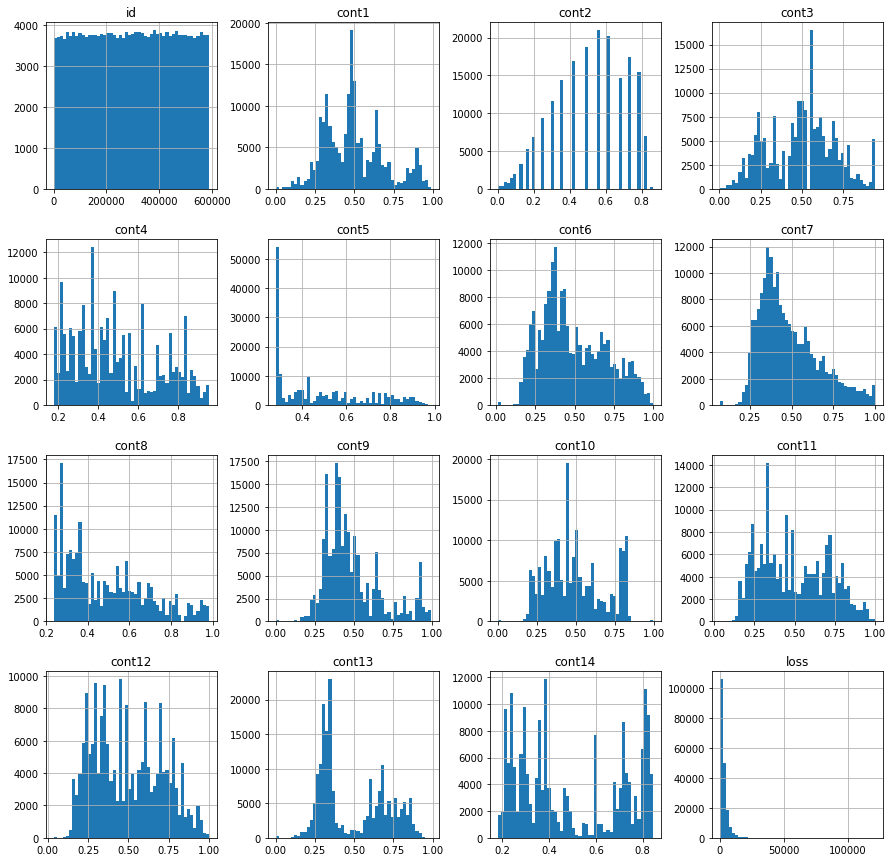

In [ ]:
"""
Histogram of the continous feature 
"""
## Histogram on continous variables befroe applying box-cox transformation
Train_Data.hist(bins=50, figsize=(15,15));

Thereare many spikes in the continous which shows that features are not distributed normally. We try transforming these features making their distribution more gaussian, but it might not improve the model's performance.

**Box-Plot** <br/>
A boxplot is a standardized way of displaying the distribution of data based on a five number summary (“minimum”, first quartile (Q1), median, third quartile (Q3), and “maximum”). It can tell you about your outliers and what their values are. It can also tell you if your data is symmetrical, how tightly your data is grouped, and if and how your data is skewed.

Nice Blog on Understanding BOX-PLOT
https://towardsdatascience.com/understanding-boxplots-5e2df7bcbd51

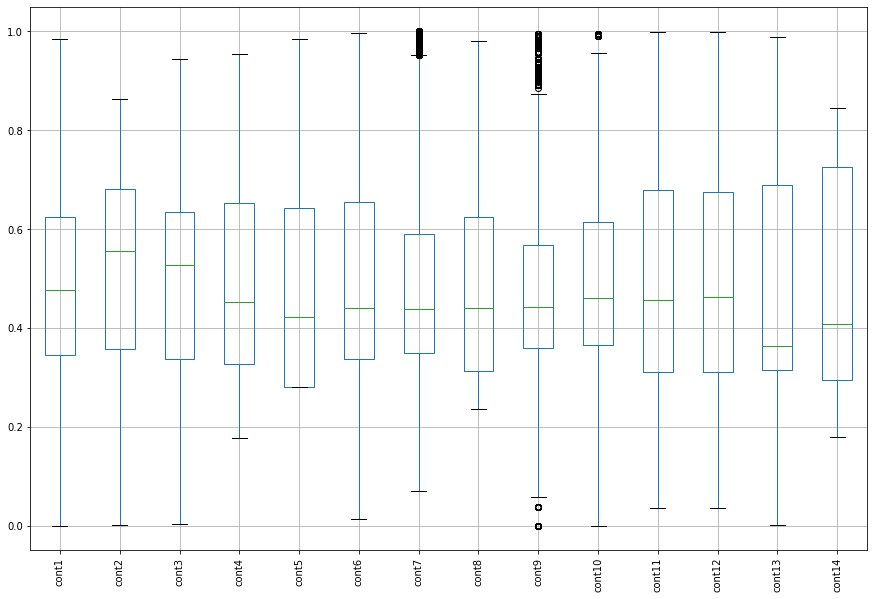

In [ ]:
boxplot = Train_Data.boxplot(column=["cont1", "cont2", "cont3", "cont4", "cont5", "cont6", "cont7", "cont8", "cont9", "cont10","cont11", "cont12", "cont13", "cont14"],rot=90,figsize=(15,10))

There are few outliers in cont7, cont9 and cont10 features. As stated above in this context, outliers are important to analysis, so them ar not removed.

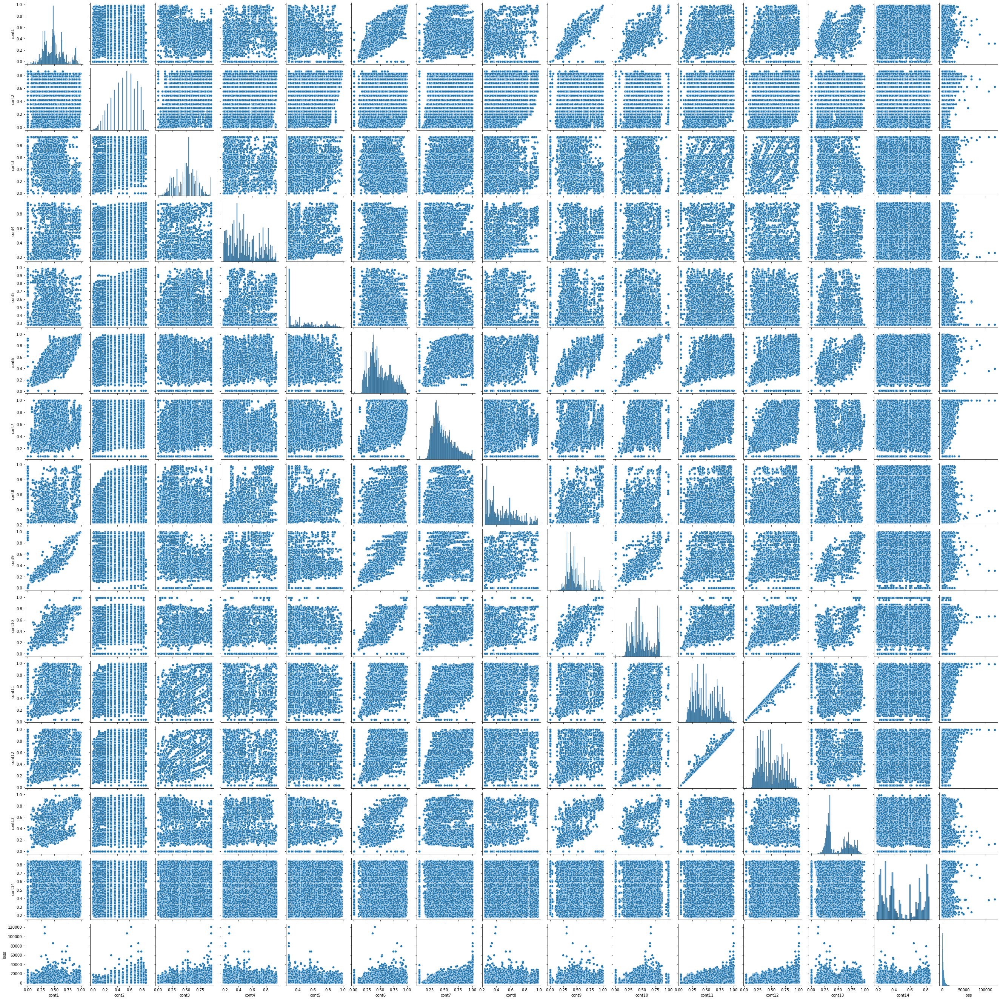

In [ ]:
"""
Pair plot on continuos variables to visulize data distribution / covariance. 
"""
sns.pairplot(Train_Data, vars=["cont1", "cont2", "cont3", "cont4", "cont5", "cont6", "cont7", "cont8", "cont9", "cont10","cont11", "cont12", "cont13", "cont14", "loss"])
plt.show()

From the pair plots we can observer that the continous varaibles with loss {target variable } is having some outliers , but we can not consider them as outliers because they might be high claims related to severe accident. <br/>

Features are not linear pattern except two or three. There are low correlated and high correlated features. So, we can plot correlation matrix between the features. 

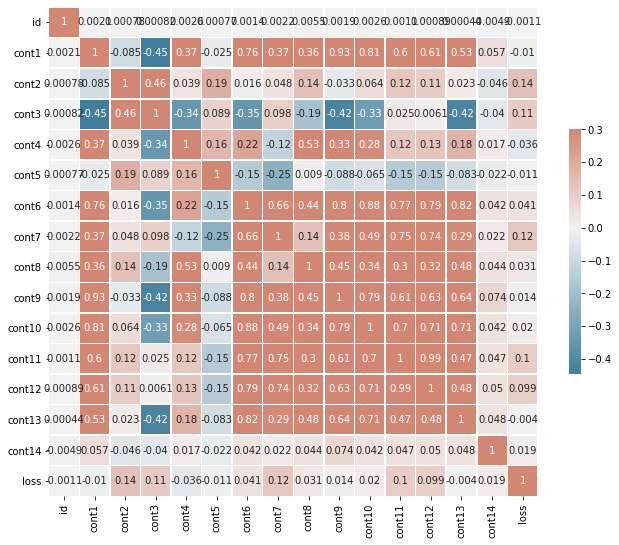

In [ ]:
"""
Correlation matirx to check the strength of covariance. 

"""
corr = Train_Data.corr(method='pearson')
f, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, cmap=cmap, vmax=.3, center=0,square=True, linewidths=.5, cbar_kws={"shrink": .5},annot = True)

1. cont11 and cont12 give an almost linear pattern...one must be removed
2. cont1 and cont9 are highly correlated ...either of them could be safely removed
3. cont6 and cont10 show very good correlation too <br/>

We see a high correlation on above listed features. This may be a result of a data-based multicollinearity as two or more predictors
are highly correlated. There are many problems it causes, so we should be very careful while implementing linear regression models
on current dataset.

In [ ]:
"""
Calculating the skewness of the continous features to check the outliers / data distribution. 
"""
skewed = Train_Data.loc[:,"cont1":"loss"].apply(lambda x: skew(x))
skewed

cont1     0.516420
cont2    -0.310939
cont3    -0.010002
cont4     0.416093
cont5     0.681617
cont6     0.461211
cont7     0.826046
cont8     0.676629
cont9     1.072420
cont10    0.354998
cont11    0.280819
cont12    0.291990
cont13    0.380739
cont14    0.248672
loss      3.794928
dtype: float64

Continous variable 2 and 3 are left skewed ( Cont3 not skewed much ~ 0) <br/>
Cont9 ( 1.0 + )varaible is more skewed compared to other cont varianbles <br/>
Target varibale is highly skewed. 

Correction of Skew { Variable transformations }

Nice source on Box-Cox transformation https://www.kaggle.com/rtatman/boxcox-transform-on-train-test-data

The Box-Cox transformation transforms our data so that it closely resembles a normal distribution. In many statistical techniques, we assume that the errors are normally distributed

In [ ]:
"""
applying box-cox transfromation on the continous features to convert them into normally distribution. 

Adding +1 to the skewness because for box-cox transfomation value should be postive and applying the box-cox transformaiton. 

First tried without adding one ,got exception and then tried with adding 1 , all set. 

Incase if we have few features with negative skew values , we can add a positive number or calcualte absolute skewnesstoapply box-cox

"""
skewed = skewed.index  
for feats in skewed:
  Train_Data[feats] = Train_Data[feats] + 1
  Train_Data[feats], lam = boxcox(Train_Data[feats])

In [ ]:
skewed_box = Train_Data.loc[:,"cont1":"loss"].apply(lambda x: skew(x))
skewed_box

cont1     0.003913
cont2    -0.102176
cont3    -0.027912
cont4     0.051768
cont5     0.205930
cont6     0.038875
cont7     0.054278
cont8     0.124674
cont9    -0.012653
cont10    0.020272
cont11    0.023379
cont12    0.024830
cont13    0.093885
cont14    0.067617
loss      0.001018
dtype: float64

Compared to the skewed values before box-cox transformation ,now it's better.

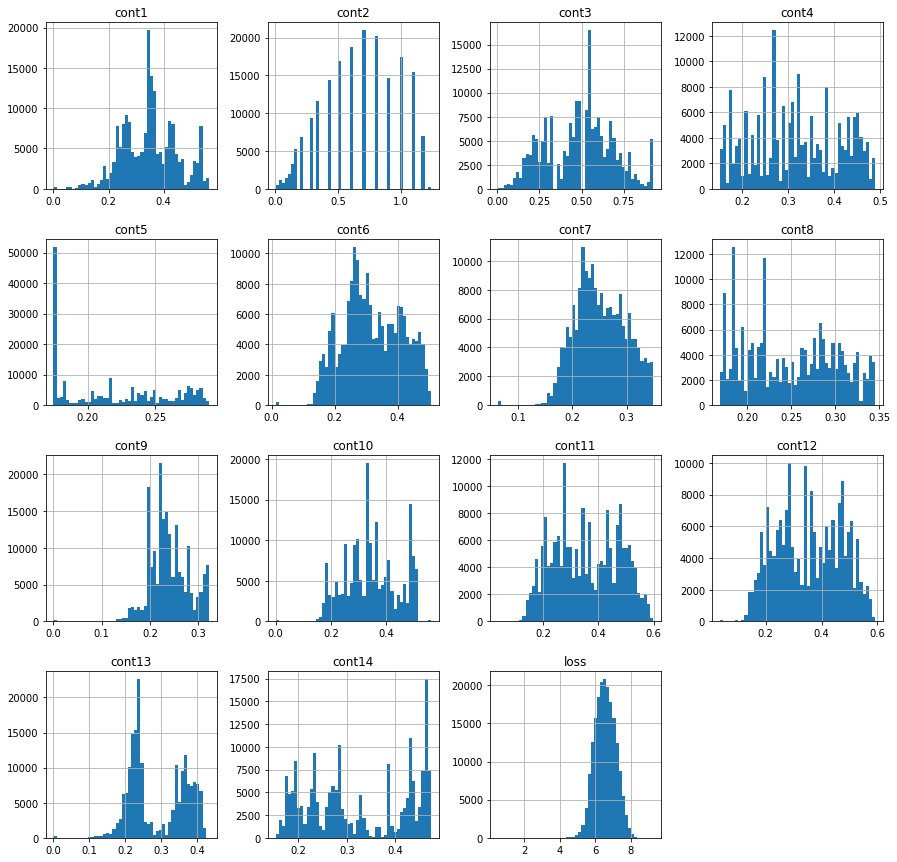

In [ ]:
"""
Histogram on continous features gives the data distirbution and outliers in data.

Here histogram plotted on box-cox trabsformation. 

"""
Train_Data.hist(bins=50, figsize=(15,15));

Visulizaing on box-cox transformation, the targeted values looks like normally distributed. 
To reverse the box-cox transformsiton 

pred_y = np.power((Data[feats] * lam) + 1, 1 / lam) - 1

In [ ]:
"""
Taking on Categorical features from Train Data Set.

"""
cat_features = list(Train_Data.select_dtypes(include=['object']).columns)
print("Categorical: {} features".format(len(cat_features)))

Categorical: 116 features


In [ ]:
"""
Calculating the unique calsses in 116 categorical features. 

"""
cat_uniques = []
for cat in cat_features:
    cat_uniques.append((cat,len(Train_Data[cat].unique())))

In [ ]:
"""
Converting the list of tuples into Dictionary followed by Data frame.

"""
cat_uniques_dict = dict(cat_uniques) 
uniq_values_in_categories = pd.DataFrame(list(cat_uniques_dict.items()))
uniq_values_in_categories.head(2)

,0,1
0,cat1,2
1,cat2,2


In [ ]:
"""
Renaming the column names.
"""
uniq_values_in_categories.rename(columns={0: "cat_fea", 1: "Unique_value"}, inplace= True)

In [ ]:
"""
Checking the number of features which unique count of classes. 

A, B 
A,B,C 
AA, AB .... so on 

"""
uniq_values = uniq_values_in_categories.groupby('Unique_value').count()
uniq_values.sort_values(by='cat_fea', inplace=True, ascending=False)
uniq_values.reset_index(inplace=True)
print(uniq_values)

    Unique_value  cat_fea
0              2       72
1              4       12
2              3        4
3              7        4
4              5        3
5              8        3
6             20        2
7             19        2
8             17        2
9             16        2
10            15        1
11            13        1
12            11        1
13             9        1
14            23        1
15            51        1
16            61        1
17            84        1
18           131        1
19           326        1


As we see, most of the categorical features, 72 out of 116 are binary, the vast majority of the features, 88 out of 116 have up to four values, there's one feature with 326 values ( Might be day of the year )

In [ ]:
features = Train_Data.columns
cats = [feat for feat in features if 'cat' in feat]

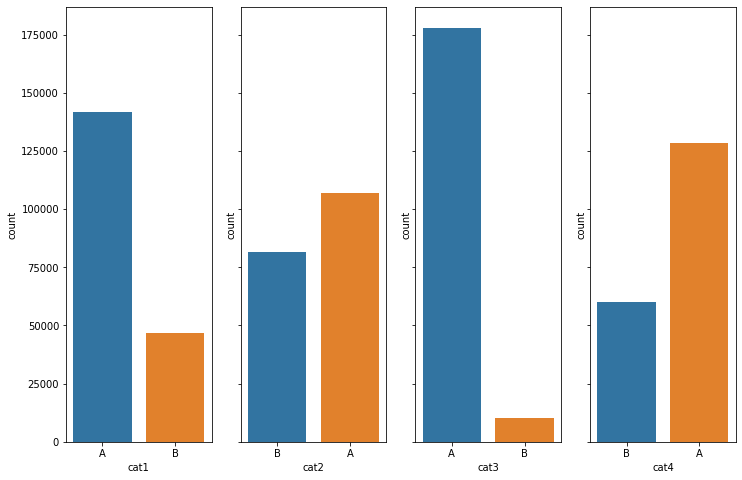

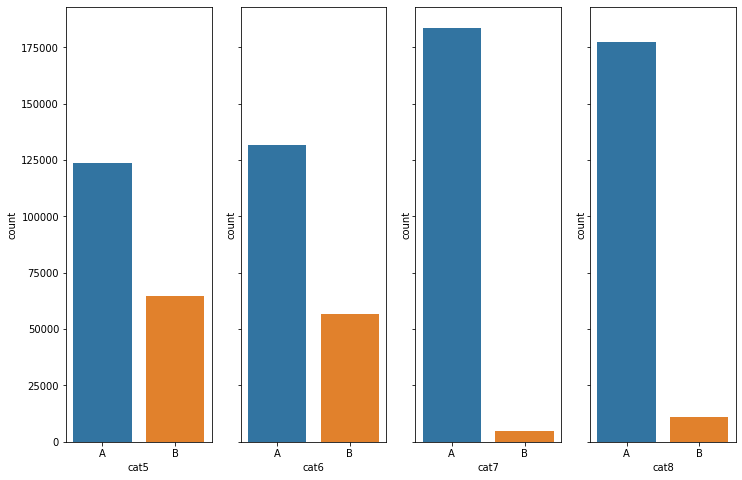

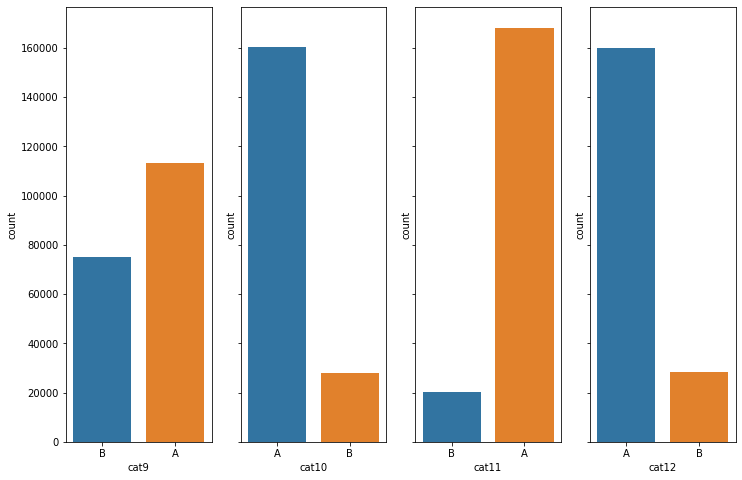

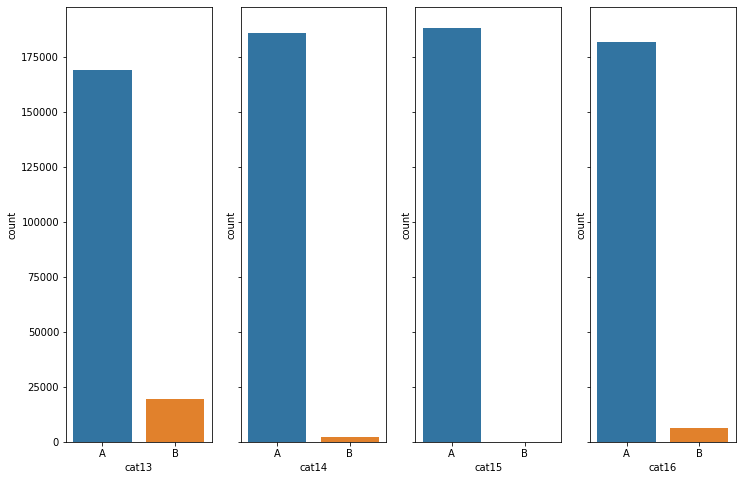

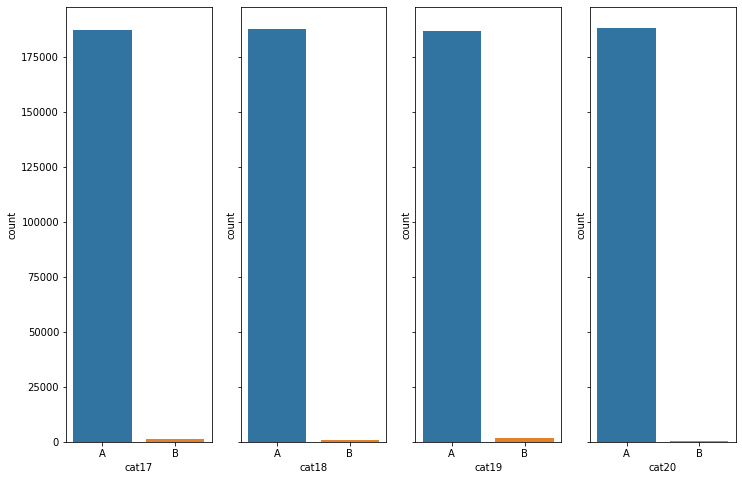

...

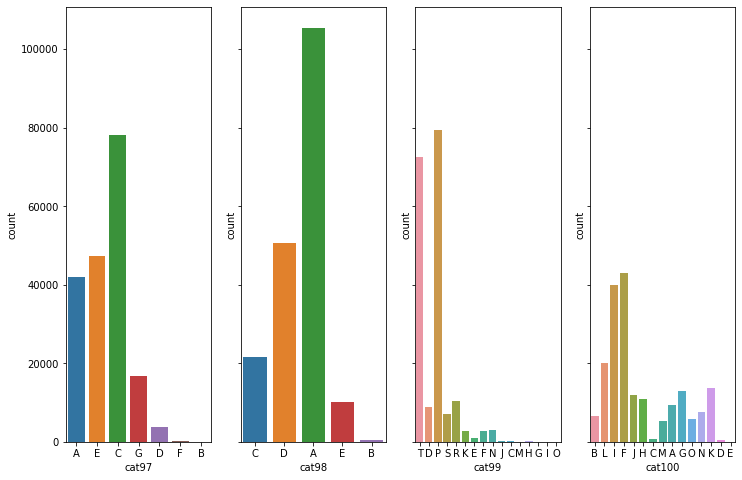

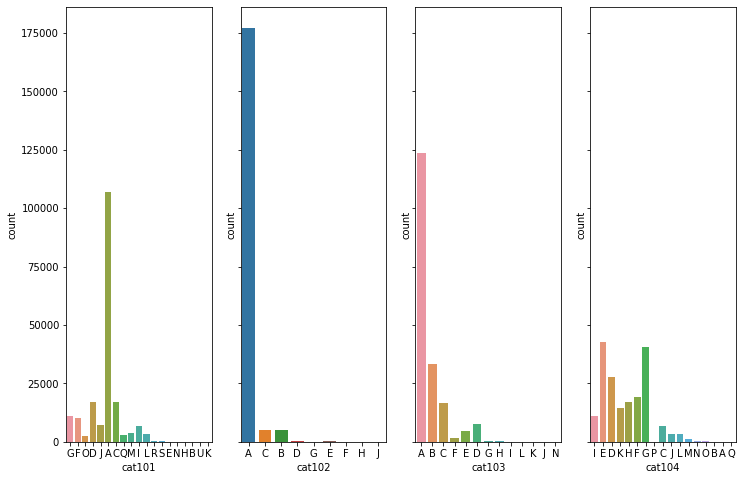

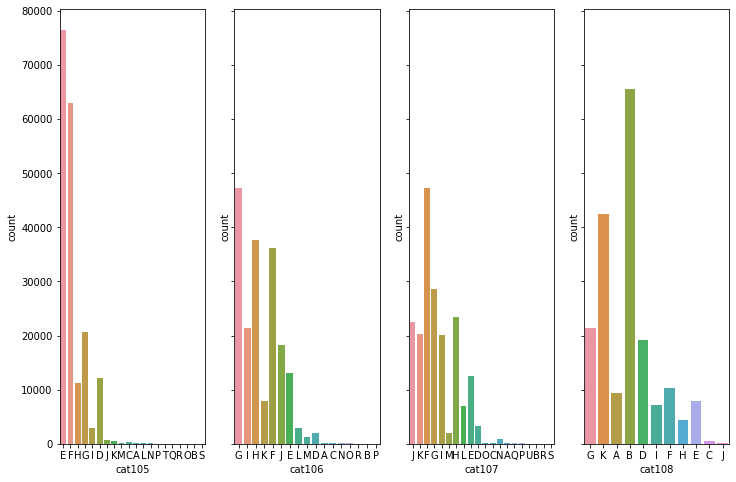

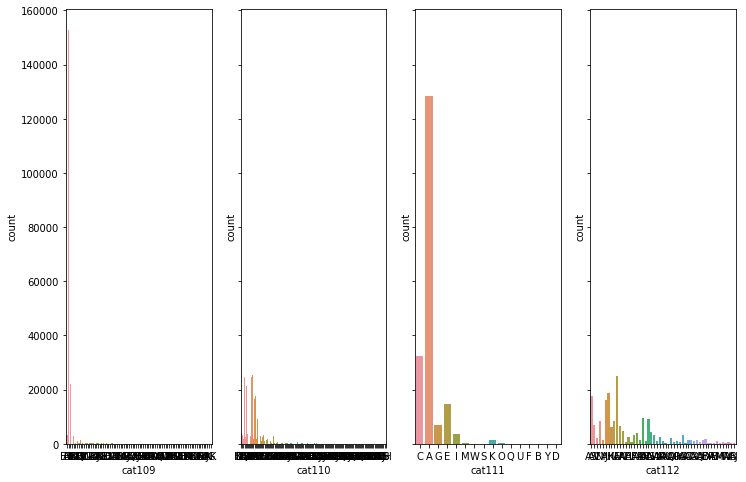

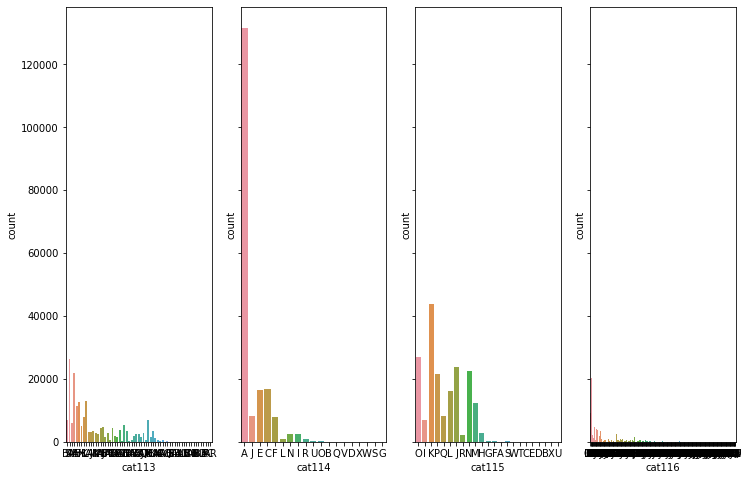

In [ ]:
"""
Plots to visulize the difference class labels in Categorical features. 

for i == 0 and j == 0 , x = clos[0*4+0], so that it takes column at 0th column 
for i == 0 and j == 1 , x = clos[0*4+1], so that it takes column at 1st column 

"""
#Plot count plot for all attributes in a 29x4 grid
# Factors of 116 are 1 x 116, 2 x 58, or 4 x 29. Here we can plot 4 * 29 Grid.
n_cols = 4
n_rows = 29
for i in range(n_rows):
    fg,ax = plt.subplots(nrows=1,ncols=n_cols,sharey=True,figsize=(12, 8))
    for j in range(n_cols):
        sns.countplot(x=cats[i*n_cols+j], data=Train_Data, ax=ax[j])

1. cat1 to cat72 have only two classes A and B. In most of the cases, B has very few entries
2. cat73 to cat 108 have more than two classes
3. cat109 to cat116 have many classes
4. Cat115 and Cat116 have more than 100 classes

No handles with labels found to put in legend.


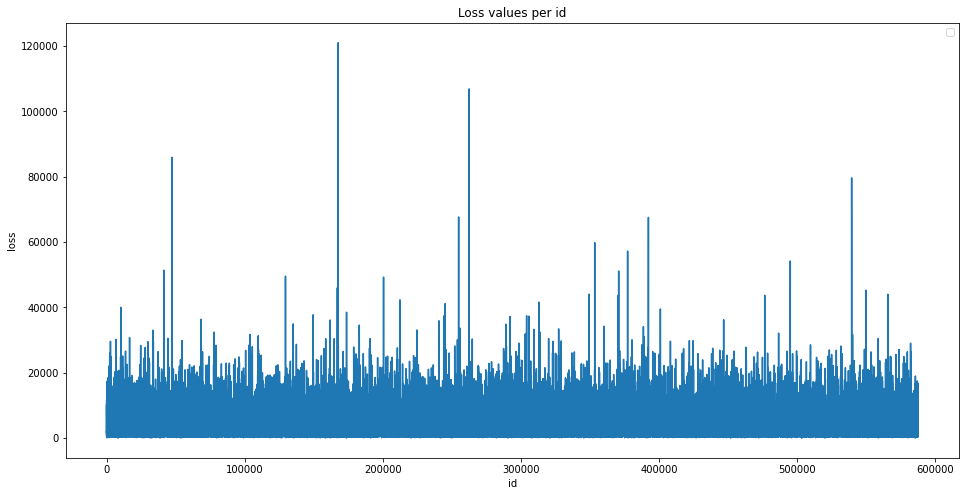

In [ ]:
"""
Loss { Target value } visulization 

"""
plt.figure(figsize=(16,8))
plt.plot(Train_Data['id'], Train_Data['loss'])
plt.title('Loss values per id')
plt.xlabel('id')
plt.ylabel('loss')
plt.legend()
plt.show()

There are several distinctive peaks in the loss values representing severe accidents [ high Claims ]. Such data distribution makes this
feature very skewed and can result in suboptimal performance of the regressor.
From Skwewed results we see that Loss is right skewed [ 3.7 ]
We can apply log transformaiton on loss variable and plot the graphs to visuliaze the updated loss ( log ).


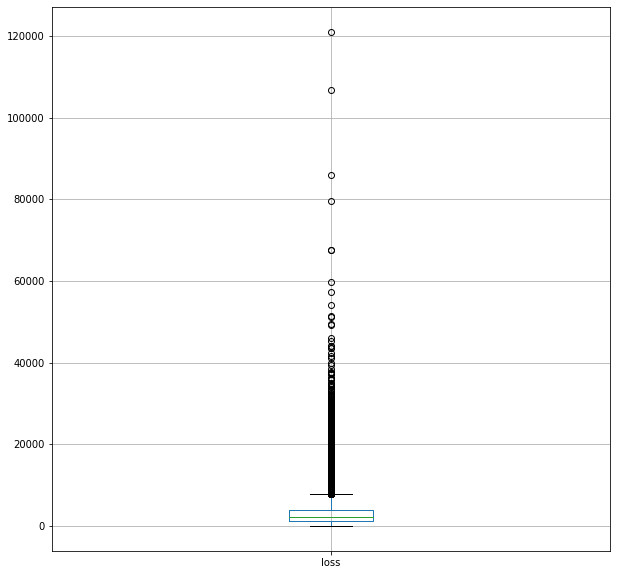

In [ ]:
"""
Boxplot on loss variable. 

"""
boxplot = Train_Data.boxplot(column=["loss"],rot=0,figsize=(10,10))

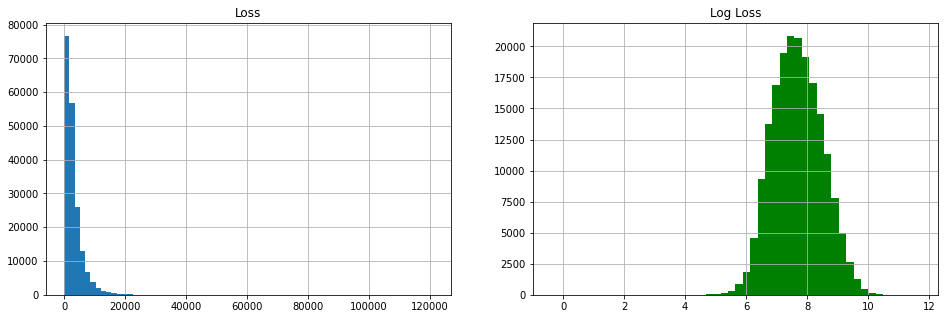

In [ ]:
"""
Plot to show the differnece of data distribution before and after log transfroamton. 

"""

import numpy as np
fig, (ax1, ax2) = plt.subplots(1,2)
fig.set_size_inches(16,5)
ax1.hist(Train_Data['loss'], bins=70)
ax1.set_title('Loss')
ax1.grid(True)
ax2.hist(np.log(Train_Data['loss']), bins=50, color='g')
ax2.set_title('Log Loss')
ax2.grid(True)
plt.show()

From the above figure , we can confirm that after applying the log transform , now data seems to be normally distributed.

As we applied logarithmic function on target feature to convert it into normal distriution. We have to apply exponential function on test data while measuring / predicting  the loss 

e**y 

**Final Observations**

*   Given data have only Cat and Con and no idea what eactly they are. As the features are anonymous, EDA became a very important stage for understanding more insights of the data.
*   We have index range from 0 to 188317 ( 188318 observations ) and 132 features ,from id to loss.
From the info it is clear that out of 132 features , 116 are categorical , 15 are continous and 1 ID columns.
*   The continuous variables have already been scaled into the interval [0,1] and all have a mean of 0.5 ( nearly )

"Loss" values are not scaled (though they might have been preprocessed as well).

*   There are no missing and duplicate features at all
*   Continous variable 2 and 3 are left skewed ( Cont3 not skewed much ~ 0) <br>
Cont9 ( 1.0 + )varaible is more skewed compared to other cont varianbles <br/>
Target varibale is highly skewed.
*   Compared to the skewed values before box-cox transformation ,after applying the box-cox looks much better.
*   As we see, most of the categorical features, 72 out of 116 are binary, the vast majority of the features, 88 out of 116 have up to four values, there's one feature with 326 values ( Might be day of the year ).
*   Thereare many spikes in the continous which shows that features are not distributed normally. We try transforming these features making their distribution more gaussian, but it might not improve the model's performance.
*   There are several distinctive peaks in the loss values representing severe accidents [ high Claims ]. Such data distribution makes this
feature very skewed and can result in suboptimal performance of the regressor.
From Skwewed results we see that Loss is right skewed [ 3.7 ]
We can apply log transformaiton on loss variable and plot the graphs to visuliaze the updated loss ( log ).
*   There are few outliers in cont7, cont9 and cont10 features. As stated above in this context, outliers are important to analysis, so them ar not removed.
*   From the pair plots we can observer that the continous varaibles with loss {target variable } is having some outliers , but we can not consider them as outliers because they might be high claims related to severe accident.
*   Features are not linear pattern except two or three. There are low correlated and high correlated features.
1. cont11 and cont12 give an almost linear pattern...one must be removed
2. cont1 and cont9 are highly correlated ...either of them could be safely removed
3. cont6 and cont10 show very good correlation too <br/>

*   We see a high correlation on above listed features. This may be a result of a data-based multicollinearity as two or more predictors
are highly correlated. There are many problems it causes, so we should be very careful while implementing linear regression models
on current dataset.

1. cat1 to cat72 have only two classes A and B. In most of the cases, B has very few entries
2. cat73 to cat 108 have more than two classes
3. cat109 to cat116 have many classes
4. Cat115 and Cat116 have more than 100 classes.

In [ ]:
"""
Copying the Train Data into new DataFrame
"""
Train_Data_Copy = Train_Data.copy()

In [ ]:
"""
Applying the label enconding on the categorical data.

"""
#label encoder for categorical features:
features = Train_Data.columns
cats = [feat for feat in features if 'cat' in feat]
for feat in cats:
  Train_Data[feat] = Train_Data[feat].astype('category').cat.codes

In [ ]:
"""
Dropping all numbercial features except target variable.
"""
Train_Data.drop(columns=['id','cont1','cont2','cont3','cont4','cont5','cont6','cont7','cont8','cont9','cont10','cont11','cont12','cont13','cont14'], inplace = True)

In [ ]:
"""
Reading top 5 rows
"""
Train_Data.head()

,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,...,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116,loss
0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,1,3,3,1,3,2,1,3,1,0,0,0,0,0,3,1,2,4,0,2,15,1,6,0,0,8,4,6,9,6,45,28,2,19,55,0,14,269,2213.18
1,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,1,3,3,0,1,2,1,3,1,0,0,0,0,0,3,3,2,4,4,3,15,11,5,0,0,4,4,8,10,10,33,65,0,22,38,0,14,85,1283.60
2,0,1,0,0,1,0,0,0,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,...,1,1,1,3,1,3,2,1,1,1,0,0,0,0,0,3,3,2,4,4,0,1,11,14,0,1,4,5,7,5,0,2,85,0,28,5,0,8,153,3005.09
3,1,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,1,3,3,3,1,2,1,3,1,0,0,0,0,0,3,3,2,4,4,3,15,8,3,0,0,4,4,8,10,10,33,67,2,39,4,0,14,79,939.85
4,0,1,0,1,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,3,1,3,1,1,2,1,1,2,0,0,0,1,5,3,1,3,4,4,0,12,5,9,0,0,3,4,10,6,1,66,50,2,50,38,0,10,55,2763.85


In [ ]:
"""
Initiating X and y for training the model.
"""
X = Train_Data.drop(["loss"], axis= 1)
y = Train_Data["loss"]

In [ ]:
"""
importing the Random Forest and initializing the hyper parameters. 
"""
from sklearn.ensemble import RandomForestRegressor
f = RandomForestRegressor(random_state = 34)

parameters = {"max_depth" :[1,5,10], "min_samples_split" :[2, 5, 10],"min_samples_leaf" :[1, 2, 4],"bootstrap" :[True, False]}

In [ ]:
"""
Tunning hyper parameter with Grid Search CV 
"""
from sklearn.model_selection import GridSearchCV
RFGS = GridSearchCV(f, parameters, cv=3,return_train_score=True,n_jobs=-1)
RFGS.fit(X,y)

GridSearchCV(cv=3, error_score=nan,
             estimator=RandomForestRegressor(bootstrap=True, ccp_alpha=0.0,
                                             criterion='mse', max_depth=None,
                                             max_features='auto',
                                             max_leaf_nodes=None,
                                             max_samples=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             n_estimators=100, n_jobs=None,
                                             oob_score=False, random_state=34,
                                             verbose=0, warm_start=False),
             iid='deprecated', n_jobs

In [ ]:
"""
Converting the results into DataFrame.
"""
CV_Results = pd.DataFrame.from_dict(RFGS.cv_results_)

In [ ]:
"""
Reading best score and best parameters. 
"""
print('Best score: ',RFGS.best_score_)
print('Parameters with best score: ',RFGS.best_params_)

Best score:  0.47665799918967205
Parameters with best score:  {'bootstrap': True, 'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 2}


In [ ]:
"""
Building Random Forest model with best parameters.
"""
Final_RF = RandomForestRegressor(bootstrap = True, max_depth = 10, min_samples_leaf = 4, min_samples_split = 2,max_features=0.2)

In [ ]:
Final_RF.fit(X,y)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=10, max_features=0.2, max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=4,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [ ]:
"""
Initializing the important features.
"""
best_features = Final_RF.feature_importances_

In [ ]:
"""
Defining the funtion to return best parameters with scores in the type of DataFrame. 
"""
def get_feature_importance_df(feature_importances,column_names):
  imp_dict = dict(zip(column_names, feature_importances))
  features = sorted(imp_dict, key=imp_dict.get, reverse=True)
  importances = [imp_dict[feature] for feature in features]
  df = pd.DataFrame(data={'feature': features, 'importance': importances})
  return df

In [ ]:
features = Train_Data.columns.values

In [ ]:
feature_importance = get_feature_importance_df(best_features, features)

## Top 10 important features and analysis with loss value

In [ ]:
feature_importance.head(10)

,feature,importance
0,cat79,0.189601
1,cat80,0.186027
2,cat101,0.071209
3,cat57,0.065916
4,cat87,0.059533
5,cat12,0.042306
6,cat81,0.042023
7,cat89,0.025495
8,cat106,0.023482
9,cat94,0.023106


In [ ]:
top10_featues = Train_Data[['cat80','cat101','cat57','cat87','cat12','cat81','cat89','cat106','cat94']]

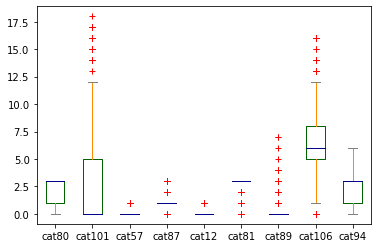

In [ ]:
"""
Applying the box-plot on top 10 features.
"""
color = {'boxes': 'DarkGreen', 'whiskers': 'DarkOrange','medians': 'DarkBlue', 'caps': 'Gray'}
boxplot = top10_featues.plot.box(color=color,sym='r+')

1. For Cat79,Cat57, Cat87,Cat81,Cat12,Cat89 and Cat7 , the data is spread around the median.
2. For the Categorical feature Cat80 the median is equal to 75th percentile. More data falls below the median.
3. For the Categorical feature Cat101 we can observer that the data falling above the median values. 
4. Cat106 is looking good compared to other features with minimum , max and IQR values. 
5.  From the box-plot we can observe that most of the claims are limited to small values. We can observer this by plotting scatter plot. 
6. There are few high claims for Cat101 and Cat106 features. 

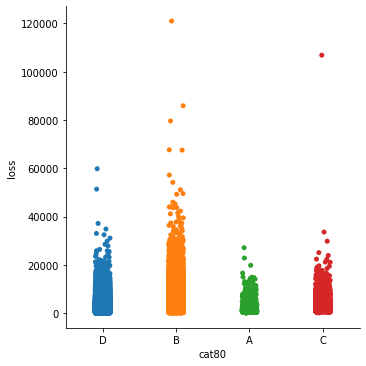

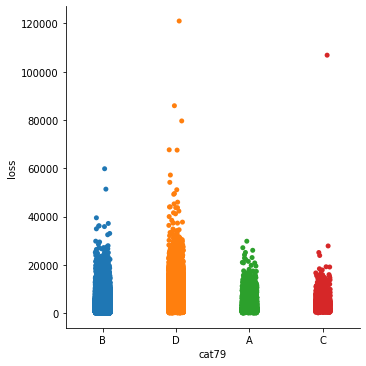

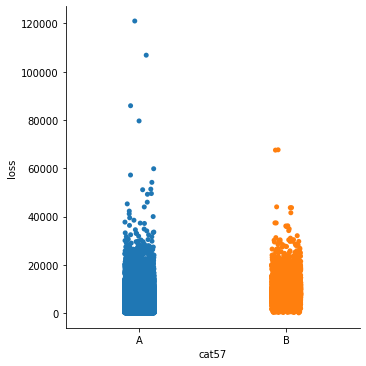

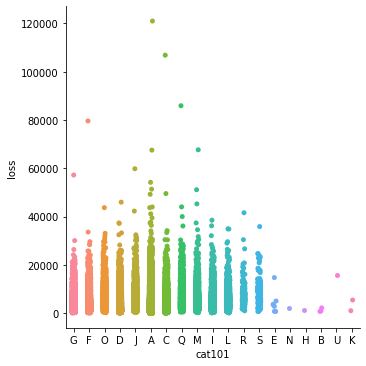

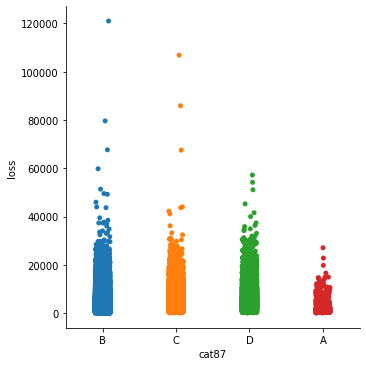

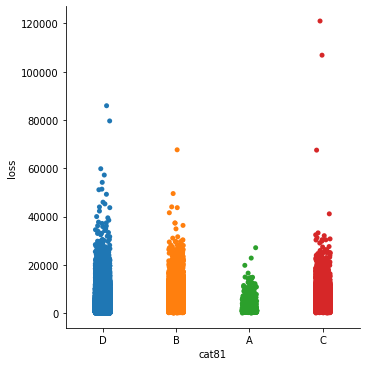

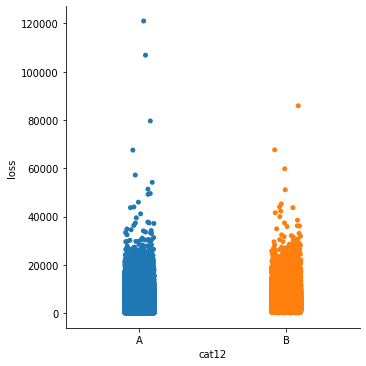

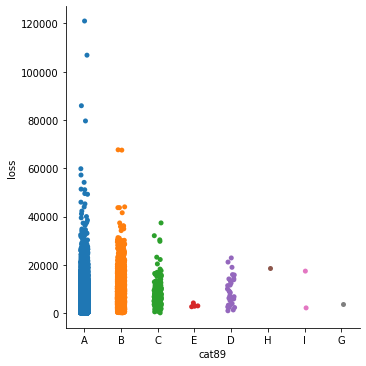

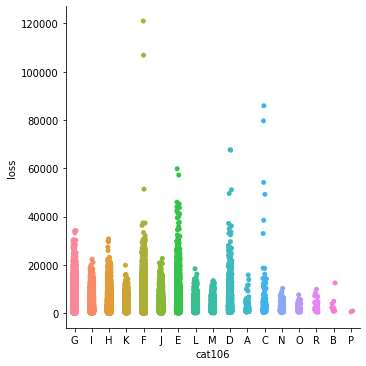

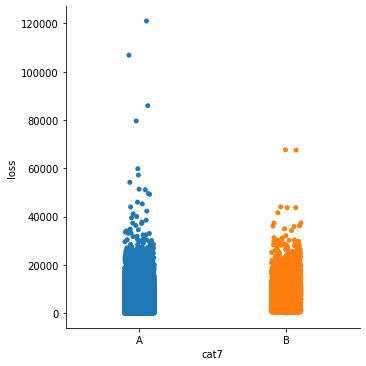

In [ ]:
"""
Plotting the top 10 features with target value , Catplot is similar to scatter plot. 

"""
sns.catplot(x='cat80', y="loss", data=Train_Data_Copy)
sns.catplot(x='cat79', y="loss", data=Train_Data_Copy)
sns.catplot(x='cat57', y="loss", data=Train_Data_Copy)
sns.catplot(x='cat101', y="loss", data=Train_Data_Copy)
sns.catplot(x='cat87', y="loss", data=Train_Data_Copy)
sns.catplot(x='cat81', y="loss", data=Train_Data_Copy)
sns.catplot(x='cat12', y="loss", data=Train_Data_Copy)
sns.catplot(x='cat89', y="loss", data=Train_Data_Copy)
sns.catplot(x='cat106', y="loss", data=Train_Data_Copy)
sns.catplot(x='cat7', y="loss", data=Train_Data_Copy)

1. From the top10 important features 
*   Cat80 , Cat79, Cat87,Cat81 are having 4 classes { A,B,C,D }
*   Cat57,Cat12,Cat7 are having 2 classes {A,B}
*   Cat101 is having 19 classes
*   Cat89 is having 8 classes
*   Cat106 is having 17 classes


2. From the catplot / scatter plot it is clear that, almost in categorical classes claims are under 40,000.

3. From the Cat80 , Cat79, Cat87,Cat81 features having 4 classes, the count of A is very less compared with B,C and D. The contribution of B and D is more compared with C as well. It clearly says contribution of very minimal. B and D are very important classes.

4. For Cat80 and Cat79, class A and C are contributing same loss where class B in Cat80 and class D in Cat79 and class D in Cat80 and class class B in Cat79 are having nearly same loss respectively.

5. From the Cat57,Cat12,Cat7 features having 2 classes, The count of A and B are almost equal. 

6. From the Cat89 features having 8 classes, the class E, H, I and G are neglible comapred with A, B , C and D. 90+% of loss is contributed by class A, B, C and D. The C and D classes are almost equal , while A is slightly higher than B.

7. For the Cat106 feature with 17 classes, all the classes are very important for claculating the loss except class B and P , count is too small compared with others. Most of the classes loss is less than 20000. Classes like G,I,H,F,E,D,C are very important for loss calcualtion. 

8. Coming to the last and final feature in top10, Cat101 with 19 classes. Where the G,F,O,D,J,A,C,Q,M,I,L,R and S classes are equally contributing for the loss { each class more than 20000 } but the classes like E,N,H,B,U and K very less and can be negliglible. 




## least 10 important features and analysis with loss value

In [ ]:
feature_importance.tail(10)

,feature,importance
106,cat56,8.326674e-06
107,cat35,7.440049e-06
108,cat20,1.717800e-06
109,cat69,4.453535e-07
110,cat68,3.407119e-07
111,cat55,2.044259e-07
112,cat15,0.000000e+00
113,cat22,0.000000e+00
114,cat64,0.000000e+00
115,cat70,0.000000e+00


In [ ]:
least10_featues = Train_Data[['cat56','cat35','cat20','cat69','cat68','cat55','cat15','cat22','cat64','cat70']]

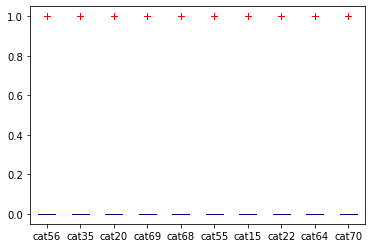

In [ ]:
"""
Applying the box-plot on top 10 features.
"""

color = {'boxes': 'DarkGreen', 'whiskers': 'DarkOrange','medians': 'DarkBlue', 'caps': 'Gray'}
boxplot = least10_featues.plot.box(color=color,sym='r+')

From the above boxplot , it is clear that all values in least 10 are spread around the median. 

Even boxplot are not visible. 

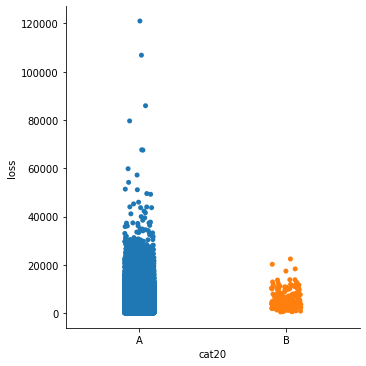

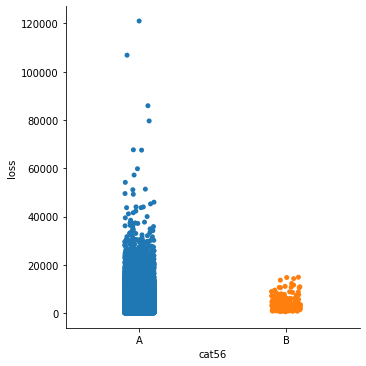

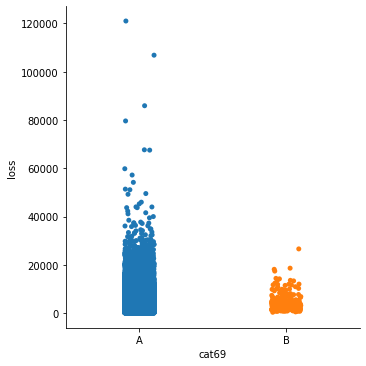

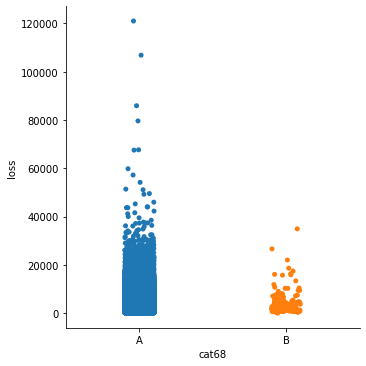

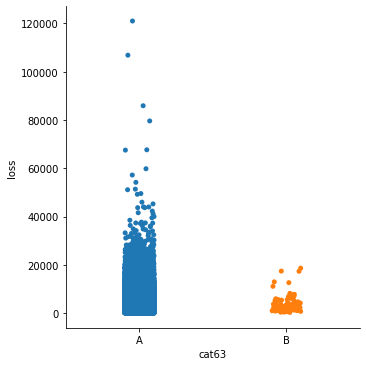

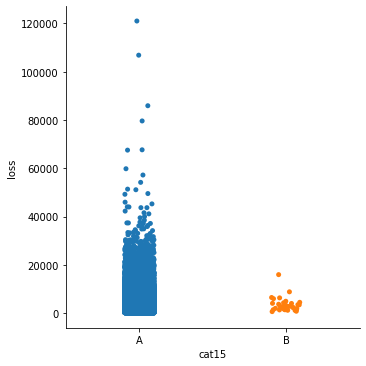

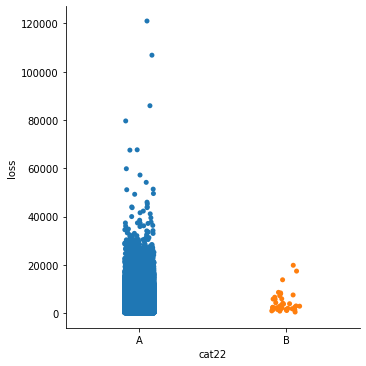

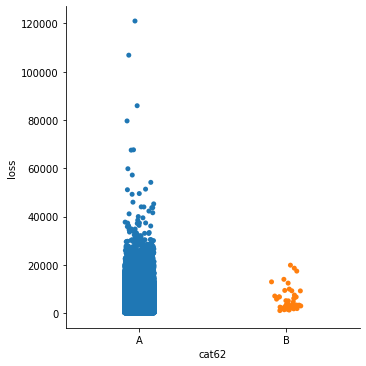

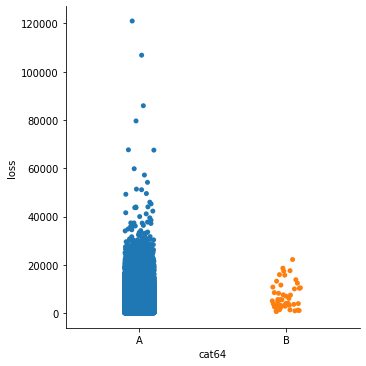

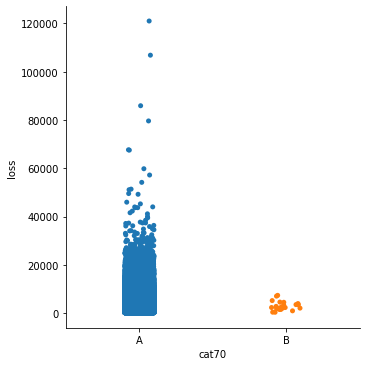

In [ ]:
"""
Plotting the least 10 features with target value , Catplot is similar to scatter plot. 

"""
sns.catplot(x='cat20', y="loss", data=Train_Data_Copy)
sns.catplot(x='cat56', y="loss", data=Train_Data_Copy)
sns.catplot(x='cat69', y="loss", data=Train_Data_Copy)
sns.catplot(x='cat68', y="loss", data=Train_Data_Copy)
sns.catplot(x='cat63', y="loss", data=Train_Data_Copy)
sns.catplot(x='cat15', y="loss", data=Train_Data_Copy)
sns.catplot(x='cat22', y="loss", data=Train_Data_Copy)
sns.catplot(x='cat62', y="loss", data=Train_Data_Copy)
sns.catplot(x='cat64', y="loss", data=Train_Data_Copy)
sns.catplot(x='cat70', y="loss", data=Train_Data_Copy)

From the above scatter / catplot , it is clear that the categorical features with two classes are less important and that too in a categorical feature where the count of class A very high { B can negligible caompared with A } is not a important feature. 

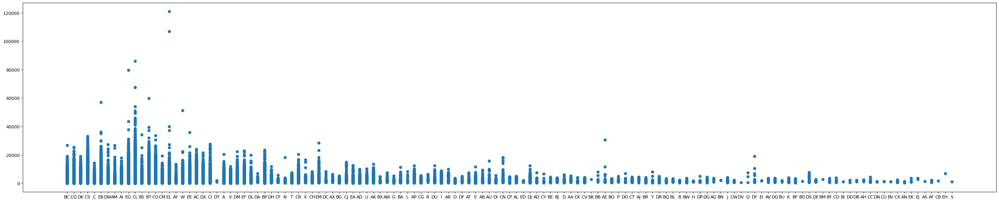

In [ ]:
## Categorical with more classes { 326 } analysis with loss.
"""
Analysing last 2 features which have more calss labels with target values. 
"""
plt.figure(figsize=(40,8), dpi=80)
plt.scatter(Train_Data_Copy['cat110'],Train_Data_Copy["loss"])

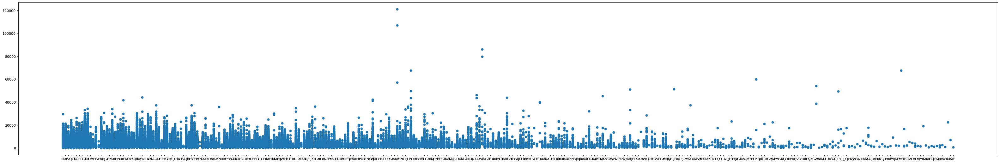

In [ ]:
plt.figure(figsize=(50,8), dpi=80)
plt.scatter(Train_Data_Copy['cat116'],Train_Data_Copy["loss"])

Most of the classes in the categorical features Cat110 and Cat116 having loss than 20000, it is clear that there are also important features are calculating loss. but the most of classes are having less than 20000 in Cat110 so it might be less important compared with Cat116. 

Let's us check same from the feature importance dataset. 

In [ ]:
"""
Retriving the importance order of the categorical features Cat116 and Cat110
"""
feature_importance[feature_importance["feature"]=="cat116"].index.values

array([15])

In [ ]:
feature_importance[feature_importance["feature"]=="cat110"].index.values

array([30])

Cat110 is 31st importance feature where as Cat116 is 14th important feature. 

From the above graphs one thing is clear that the categorical which are more important features are having loss values for almost all classes are less than 20000

## Correlation between Categorical features

In [ ]:
"""
Correlation matrix for Categorical Features

"""
## https://pandas.pydata.org/pandas-docs/version/0.18.1/generated/pandas.Series.order.html
corrCatMatrix = Train_Data.corr(method='pearson')
s = corrCatMatrix.unstack()
sortedSeries= s.sort_values(kind="quicksort",ascending=False)

In [ ]:
"""
Top 10 highly coreelated features

"""
print("Top 10 most correlated categorical feature pairs: \n")
print(sortedSeries[sortedSeries != 1.0][0:20])

Top 10 most correlated categorical feature pairs: 

cat90   cat3      0.955738
cat3    cat90     0.955738
cat89   cat7      0.955504
cat7    cat89     0.955504
cat9    cat2      0.932420
cat2    cat9      0.932420
cat6    cat50     0.925731
cat50   cat6      0.925731
cat104  cat116    0.918193
cat116  cat104    0.918193
cat102  cat8      0.900799
cat8    cat102    0.900799
cat98   cat86     0.886774
cat86   cat98     0.886774
cat66   cat8      0.862231
cat8    cat66     0.862231
cat115  cat86     0.850152
cat86   cat115    0.850152
cat4    cat111    0.829929
cat111  cat4      0.829929
dtype: float64


In [ ]:
"""
Least correlated features.
"""
print("Least 10 most correlated categorical feature pairs: \n")
print(sortedSeries[sortedSeries != 1.0][-20:])

Least 10 most correlated categorical feature pairs: 

cat2    cat6     -0.438015
cat6    cat2     -0.438015
cat87   cat80    -0.458451
cat80   cat87    -0.458451
cat84   cat92    -0.464258
cat92   cat84    -0.464258
cat80   loss     -0.473257
loss    cat80    -0.473257
cat95   cat86    -0.477458
cat86   cat95    -0.477458
cat76   cat77    -0.507849
cat77   cat76    -0.507849
cat79   cat80    -0.567659
cat80   cat79    -0.567659
cat104  cat106   -0.753295
cat106  cat104   -0.753295
cat84   cat91    -0.773455
cat91   cat84    -0.773455
cat116  cat106   -0.776720
cat106  cat116   -0.776720
dtype: float64


## Is train and test datasets are identical ?

In [ ]:
"""
Checking the columns are identical or not in Train and Test data
"""
train_features = list(Train_Data.columns.values)
train_features.pop() #pop out the loss column
test_features = list(Test_Data.columns.values)
print('Is train and test datasets are identical ? ' + str(train_features == test_features))

Is train and test datasets are identical ? True


## Classes missing in train / test datasets

In [ ]:
"""
Dropping all numbercial features except target variable.
"""
Train_Data.drop(columns=['id','cont1','cont2','cont3','cont4','cont5','cont6','cont7','cont8','cont9','cont10','cont11','cont12','cont13','cont14','loss'], inplace = True)
Test_Data.drop(columns=['id','cont1','cont2','cont3','cont4','cont5','cont6','cont7','cont8','cont9','cont10','cont11','cont12','cont13','cont14'], inplace = True)

In [ ]:
"""
Retriving the missing classes from Train and Test Datasets.

"""
Train_Data_classes_missing = {}
Test_Data_classes_missing = {}
for column in Train_Data.columns.values:
  if Train_Data[column].nunique() != Test_Data[column].nunique():
    Unique_classes_Train = set(Train_Data[column].unique())
    Unique_classes_Test = set(Test_Data[column].unique())
    Train_Data_classes_missing[column] = list(Unique_classes_Train.difference(Unique_classes_Test))
  
  if Test_Data[column].nunique() != Train_Data[column].nunique():
    Unique_classes_Train = set(Train_Data[column].unique())
    Unique_classes_Test = set(Test_Data[column].unique())
    Test_Data_classes_missing[column] = list(Unique_classes_Test.difference(Unique_classes_Train))

In [ ]:
Class_missing_Train = pd.DataFrame(list(Train_Data_classes_missing.items()),columns = ['Feature','missing'])
Class_missing_Test  = pd.DataFrame(list(Test_Data_classes_missing.items()),columns = ['Feature','missing'])

In [ ]:
Class_missing_Train

,Feature,missing
0,cat90,[G]
1,cat92,[F]
2,cat96,[]
3,cat99,[]
4,cat101,"[N, U]"
5,cat102,"[H, J]"
6,cat103,[]
7,cat105,"[R, S]"
8,cat106,[]
9,cat109,"[CJ, B, BY, BF, AK, BT, BV, J, AG, BM, BP]"


In [ ]:
Class_missing_Test

,Feature,missing
0,cat90,[]
1,cat92,"[E, G]"
2,cat96,[H]
3,cat99,[U]
4,cat101,[]
5,cat102,[]
6,cat103,[M]
7,cat105,[]
8,cat106,[Q]
9,cat109,[AD]


From the above table we can observe that there are few classes which are present in Train data but missing in Test data and vice versa. 

<h2>3.2. Feature extraction </h2>

We have observed that the continous features are skewed. So, Let's apply Log , Square / Square root , Normalization , Standardization and few other

### MinMax_Scale

In [ ]:
"""

Applying minmax scale on continous variables
"""

from sklearn.preprocessing import minmax_scale
Train_Data["minmax_scale_cont1"] = minmax_scale(Train_Data["cont1"])
Train_Data["minmax_scale_cont2"] = minmax_scale(Train_Data["cont2"])  
Train_Data["minmax_scale_cont3"] = minmax_scale(Train_Data["cont3"])
Train_Data["minmax_scale_cont4"] = minmax_scale(Train_Data["cont4"])
Train_Data["minmax_scale_cont5"] = minmax_scale(Train_Data["cont5"])
Train_Data["minmax_scale_cont6"] = minmax_scale(Train_Data["cont6"])
Train_Data["minmax_scale_cont7"] = minmax_scale(Train_Data["cont7"])
Train_Data["minmax_scale_cont8"] = minmax_scale(Train_Data["cont8"])
Train_Data["minmax_scale_cont9"] = minmax_scale(Train_Data["cont9"])
Train_Data["minmax_scale_cont10"] = minmax_scale(Train_Data["cont10"])
Train_Data["minmax_scale_cont11"] = minmax_scale(Train_Data["cont11"])
Train_Data["minmax_scale_cont12"] = minmax_scale(Train_Data["cont12"])
Train_Data["minmax_scale_cont13"] = minmax_scale(Train_Data["cont13"])
Train_Data["minmax_scale_cont14"] = minmax_scale(Train_Data["cont14"])

### Logarithm

In [ ]:
"""

Applying log function on continous variables
"""

Train_Data["log_cont1"] = np.log(Train_Data["cont1"])
Train_Data["log_cont2"] = np.log(Train_Data["cont2"])  
Train_Data["log_cont3"] = np.log(Train_Data["cont3"])
Train_Data["log_cont4"] = np.log(Train_Data["cont4"])
Train_Data["log_cont5"] = np.log(Train_Data["cont5"])
Train_Data["log_cont6"] = np.log(Train_Data["cont6"])
Train_Data["log_cont7"] = np.log(Train_Data["cont7"])
Train_Data["log_cont8"] = np.log(Train_Data["cont8"])
Train_Data["log_cont9"] = np.log(Train_Data["cont9"])
Train_Data["log_cont10"] = np.log(Train_Data["cont10"])
Train_Data["log_cont11"] = np.log(Train_Data["cont11"])
Train_Data["log_cont12"] = np.log(Train_Data["cont12"])
Train_Data["log_cont13"] = np.log(Train_Data["cont13"])
Train_Data["log_cont14"] = np.log(Train_Data["cont14"])

### Box_Cox tandformation

In [ ]:
"""

Applying box-cox tranforamtion on continous variables
"""

Train_Data["box_cox_cont1"], lam = boxcox(Train_Data["cont1"] + 1)
Train_Data["box_cox_cont2"], lam = boxcox(Train_Data["cont2"] + 1)  
Train_Data["box_cox_cont3"], lam = boxcox(Train_Data["cont3"] + 1)
Train_Data["box_cox_cont4"], lam = boxcox(Train_Data["cont4"] + 1)
Train_Data["box_cox_cont5"], lam = boxcox(Train_Data["cont5"] + 1)
Train_Data["box_cox_cont6"], lam = boxcox(Train_Data["cont6"] + 1)
Train_Data["box_cox_cont7"], lam = boxcox(Train_Data["cont7"] + 1)
Train_Data["box_cox_cont8"], lam = boxcox(Train_Data["cont8"] + 1)
Train_Data["box_cox_cont9"], lam = boxcox(Train_Data["cont9"] + 1)
Train_Data["box_cox_cont10"], lam = boxcox(Train_Data["cont10"] + 1)
Train_Data["box_cox_cont11"], lam = boxcox(Train_Data["cont11"] + 1)
Train_Data["box_cox_cont12"], lam = boxcox(Train_Data["cont12"] + 1)
Train_Data["box_cox_cont13"], lam = boxcox(Train_Data["cont13"] + 1)
Train_Data["box_cox_cont14"], lam = boxcox(Train_Data["cont14"] + 1)

## Applying Squareroot on continous features.

In [ ]:
"""

Applying Square root function on continous variables
"""

Train_Data["sqrt_cont1"] = np.sqrt(Train_Data["cont1"])
Train_Data["sqrt_cont2"] = np.sqrt(Train_Data["cont2"])  
Train_Data["sqrt_cont3"] = np.sqrt(Train_Data["cont3"])
Train_Data["sqrt_cont4"] = np.sqrt(Train_Data["cont4"])
Train_Data["sqrt_cont5"] = np.sqrt(Train_Data["cont5"])
Train_Data["sqrt_cont6"] = np.sqrt(Train_Data["cont6"])
Train_Data["sqrt_cont7"] = np.sqrt(Train_Data["cont7"])
Train_Data["sqrt_cont8"] = np.sqrt(Train_Data["cont8"])
Train_Data["sqrt_cont9"] = np.sqrt(Train_Data["cont9"])
Train_Data["sqrt_cont10"] = np.sqrt(Train_Data["cont10"])
Train_Data["sqrt_cont11"] = np.sqrt(Train_Data["cont11"])
Train_Data["sqrt_cont12"] = np.sqrt(Train_Data["cont12"])
Train_Data["sqrt_cont13"] = np.sqrt(Train_Data["cont13"])
Train_Data["sqrt_cont14"] = np.sqrt(Train_Data["cont14"])

### Applying Exponential from on continous features.

In [ ]:
"""

Applying exponential function on continous variables
"""

Train_Data["exp_cont1"] = np.exp(Train_Data["cont1"])
Train_Data["exp_cont2"] = np.exp(Train_Data["cont2"])  
Train_Data["exp_cont3"] = np.exp(Train_Data["cont3"])
Train_Data["exp_cont4"] = np.exp(Train_Data["cont4"])
Train_Data["exp_cont5"] = np.exp(Train_Data["cont5"])
Train_Data["exp_cont6"] = np.exp(Train_Data["cont6"])
Train_Data["exp_cont7"] = np.exp(Train_Data["cont7"])
Train_Data["exp_cont8"] = np.exp(Train_Data["cont8"])
Train_Data["exp_cont9"] = np.exp(Train_Data["cont9"])
Train_Data["exp_cont10"] = np.exp(Train_Data["cont10"])
Train_Data["exp_cont11"] = np.exp(Train_Data["cont11"])
Train_Data["exp_cont12"] = np.exp(Train_Data["cont12"])
Train_Data["exp_cont13"] = np.exp(Train_Data["cont13"])
Train_Data["exp_cont14"] = np.exp(Train_Data["cont14"])

### Applying square root on pre-processed min max features.

In [ ]:
"""

Applying Square root function on minmax scale continous variables
"""

Train_Data["sqrt_minmax_cont1"] = np.sqrt(Train_Data["minmax_scale_cont1"])
Train_Data["sqrt_minmax_cont2"] = np.sqrt(Train_Data["minmax_scale_cont2"])  
Train_Data["sqrt_minmax_cont3"] = np.sqrt(Train_Data["minmax_scale_cont3"])
Train_Data["sqrt_minmax_cont4"] = np.sqrt(Train_Data["minmax_scale_cont4"])
Train_Data["sqrt_minmax_cont5"] = np.sqrt(Train_Data["minmax_scale_cont5"])
Train_Data["sqrt_minmax_cont6"] = np.sqrt(Train_Data["minmax_scale_cont6"])
Train_Data["sqrt_minmax_cont7"] = np.sqrt(Train_Data["minmax_scale_cont7"])
Train_Data["sqrt_minmax_cont8"] = np.sqrt(Train_Data["minmax_scale_cont8"])
Train_Data["sqrt_minmax_cont9"] = np.sqrt(Train_Data["minmax_scale_cont9"])
Train_Data["sqrt_minmax_cont10"] = np.sqrt(Train_Data["minmax_scale_cont10"])
Train_Data["sqrt_minmax_cont11"] = np.sqrt(Train_Data["minmax_scale_cont11"])
Train_Data["sqrt_minmax_cont12"] = np.sqrt(Train_Data["minmax_scale_cont12"])
Train_Data["sqrt_minmax_cont13"] = np.sqrt(Train_Data["minmax_scale_cont13"])
Train_Data["sqrt_minmax_cont14"] = np.sqrt(Train_Data["minmax_scale_cont14"])

### Applying powers of 1/4 , 2 and 4 on pre-processed min max scale.

In [ ]:
"""

Applying powers of 1/4 , 2 and 4 on minmax continous variables
"""

Train_Data["1_4_minmax_cont1"] = Train_Data["minmax_scale_cont1"]**(1/4)
Train_Data["1_4_minmax_cont2"] = Train_Data["minmax_scale_cont2"]**(1/4)  
Train_Data["1_4_minmax_cont3"] = Train_Data["minmax_scale_cont3"]**(1/4)
Train_Data["1_4_minmax_cont4"] = Train_Data["minmax_scale_cont4"]**(1/4)
Train_Data["1_4_minmax_cont5"] = Train_Data["minmax_scale_cont5"]**(1/4)
Train_Data["1_4_minmax_cont6"] = Train_Data["minmax_scale_cont6"]**(1/4)
Train_Data["1_4_minmax_cont7"] = Train_Data["minmax_scale_cont7"]**(1/4)
Train_Data["1_4_minmax_cont8"] = Train_Data["minmax_scale_cont8"]**(1/4)
Train_Data["1_4_minmax_cont9"] = Train_Data["minmax_scale_cont9"]**(1/4)
Train_Data["1_4_minmax_cont10"] = Train_Data["minmax_scale_cont10"]**(1/4)
Train_Data["1_4_minmax_cont11"] = Train_Data["minmax_scale_cont11"]**(1/4)
Train_Data["1_4_minmax_cont12"] = Train_Data["minmax_scale_cont12"]**(1/4)
Train_Data["1_4_minmax_cont13"] = Train_Data["minmax_scale_cont13"]**(1/4)
Train_Data["1_4_minmax_cont14"] = Train_Data["minmax_scale_cont14"]**(1/4)

Train_Data["2_minmax_cont1"] = Train_Data["minmax_scale_cont1"]**2
Train_Data["2_minmax_cont2"] = Train_Data["minmax_scale_cont2"]**2  
Train_Data["2_minmax_cont3"] = Train_Data["minmax_scale_cont3"]**2
Train_Data["2_minmax_cont4"] = Train_Data["minmax_scale_cont4"]**2
Train_Data["2_minmax_cont5"] = Train_Data["minmax_scale_cont5"]**2
Train_Data["2_minmax_cont6"] = Train_Data["minmax_scale_cont6"]**2
Train_Data["2_minmax_cont7"] = Train_Data["minmax_scale_cont7"]**2
Train_Data["2_minmax_cont8"] = Train_Data["minmax_scale_cont8"]**2
Train_Data["2_minmax_cont9"] = Train_Data["minmax_scale_cont9"]**2
Train_Data["2_minmax_cont10"] = Train_Data["minmax_scale_cont10"]**2
Train_Data["2_minmax_cont11"] = Train_Data["minmax_scale_cont11"]**2
Train_Data["2_minmax_cont12"] = Train_Data["minmax_scale_cont12"]**2
Train_Data["2_minmax_cont13"] = Train_Data["minmax_scale_cont13"]**2
Train_Data["2_minmax_cont14"] = Train_Data["minmax_scale_cont14"]**2

Train_Data["4_minmax_cont1"] = Train_Data["minmax_scale_cont1"]**4
Train_Data["4_minmax_cont2"] = Train_Data["minmax_scale_cont2"]**4  
Train_Data["4_minmax_cont3"] = Train_Data["minmax_scale_cont3"]**4
Train_Data["4_minmax_cont4"] = Train_Data["minmax_scale_cont4"]**4
Train_Data["4_minmax_cont5"] = Train_Data["minmax_scale_cont5"]**4
Train_Data["4_minmax_cont6"] = Train_Data["minmax_scale_cont6"]**4
Train_Data["4_minmax_cont7"] = Train_Data["minmax_scale_cont7"]**4
Train_Data["4_minmax_cont8"] = Train_Data["minmax_scale_cont8"]**4
Train_Data["4_minmax_cont9"] = Train_Data["minmax_scale_cont9"]**4
Train_Data["4_minmax_cont10"] = Train_Data["minmax_scale_cont10"]**4
Train_Data["4_minmax_cont11"] = Train_Data["minmax_scale_cont11"]**4
Train_Data["4_minmax_cont12"] = Train_Data["minmax_scale_cont12"]**4
Train_Data["4_minmax_cont13"] = Train_Data["minmax_scale_cont13"]**4
Train_Data["4_minmax_cont14"] = Train_Data["minmax_scale_cont14"]**4

### Final DataFrame

In [ ]:
Train_Data.head()

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,...,1_4_minmax_cont3,1_4_minmax_cont4,1_4_minmax_cont5,1_4_minmax_cont6,1_4_minmax_cont7,1_4_minmax_cont8,1_4_minmax_cont9,1_4_minmax_cont10,1_4_minmax_cont11,1_4_minmax_cont12,1_4_minmax_cont13,1_4_minmax_cont14,2_minmax_cont1,2_minmax_cont2,2_minmax_cont3,2_minmax_cont4,2_minmax_cont5,2_minmax_cont6,2_minmax_cont7,2_minmax_cont8,2_minmax_cont9,2_minmax_cont10,2_minmax_cont11,2_minmax_cont12,2_minmax_cont13,2_minmax_cont14,4_minmax_cont1,4_minmax_cont2,4_minmax_cont3,4_minmax_cont4,4_minmax_cont5,4_minmax_cont6,4_minmax_cont7,4_minmax_cont8,4_minmax_cont9,4_minmax_cont10,4_minmax_cont11,4_minmax_cont12,4_minmax_cont13,4_minmax_cont14
0,1,A,B,A,B,A,A,A,A,B,A,B,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,...,0.665724,0.942231,0.450428,0.920134,0.730905,0.545294,0.906220,0.957152,0.863013,0.872804,0.955068,0.947081,0.543722,0.080725,0.038579,0.621239,0.001694,0.513816,0.081449,0.007817,0.454851,0.704447,0.307709,0.336771,0.692271,0.647286,0.295633,0.006517,0.001488,0.385938,0.000003,0.264007,0.006634,6.110643e-05,0.206889,0.496245,0.094685,0.113415,0.479239,0.418979
1,2,A,B,A,A,A,A,A,A,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,...,0.889719,0.865995,0.963201,0.811167,0.792523,0.836524,0.770717,0.815097,0.748865,0.765299,0.886805,0.658120,0.112590,0.729700,0.392667,0.316318,0.740860,0.187449,0.155631,0.239788,0.124497,0.194839,0.098907,0.117665,0.382493,0.035192,0.012677,0.532462,0.154188,0.100057,0.548873,0.035137,0.024221,5.749824e-02,0.015499,0.037962,0.009783,0.013845,0.146301,0.001238
2,5,A,B,A,A,B,A,A,A,B,B,B,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,...,0.845657,0.527091,0.637351,0.728290,0.717090,0.470157,0.715379,0.755678,0.774175,0.769391,0.666895,0.972409,0.070662,0.171884,0.261551,0.005958,0.027229,0.079147,0.069918,0.002387,0.068595,0.106339,0.129037,0.122794,0.039126,0.799452,0.004993,0.029544,0.068409,0.000035,0.000741,0.006264,0.004889,5.700069e-06,0.004705,0.011308,0.016650,0.015078,0.001531,0.639124
3,10,B,B,A,B,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,...,0.864261,0.709416,0.669475,0.812130,0.766759,0.574691,0.753708,0.817628,0.742356,0.737934,0.884491,0.892974,0.106595,0.414473,0.311287,0.064152,0.040353,0.189237,0.119473,0.011898,0.104142,0.199732,0.092236,0.087931,0.374581,0.404305,0.011362,0.171788,0.096899,0.004115,0.001628,0.035811,0.014274,1.415636e-04,0.010846,0.039893,0.008507,0.007732,0.140311,0.163462
4,11,A,B,A,B,A,A,A,A,B,B,A,B,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,...,0.864261,0.785721,0.880949,0.640331,0.661254,0.329482,0.686300,0.679648,0.647519,0.644455,0.706187,0.785244,0.076928,0.033995,0.311287,0.145260,0.362749,0.028264,0.036555,0.000139,0.049217,0.045527,0.030904,0.029754,0.061852,0.144556,0.005918,0.001156,0.096899,0.021100,0.131587,0.000799,0.001336,1.928915e-08,0.002422,0.002073,0.000955,0.000885,0.003826,0.020896


Applied 12 featuure engineering techniques on contionus features ,140 additional features been added to dataset. 

132+ (9*14) = 258

Now let's do some analysis on those addtional features and delete unwanted features. 

In [ ]:
Train_Data.isnull().values.any()

False

After feature engineering there is no null values observed.

### Removing the new features where skew is greater than old features

In [ ]:
"""
Calculating the skewness on all feature engineering techniques applied.

"""

normal_skew = list(Train_Data.loc[:,"cont1":"cont14"].apply(lambda x: skew(x)))

minmax_scale_skew = list(Train_Data.loc[:,"minmax_scale_cont1":"minmax_scale_cont14"].apply(lambda x: skew(x)))
log_skew = list(Train_Data.loc[:,"log_cont1":"log_cont14"].apply(lambda x: skew(x)))                                     ## 1
box_cox_skew = list(Train_Data.loc[:,"box_cox_cont1":"box_cox_cont14"].apply(lambda x: skew(x)))
sqrt_scale_skew = list(Train_Data.loc[:,"sqrt_cont1":"sqrt_cont14"].apply(lambda x: skew(x)))
exp_scale_skew = list(Train_Data.loc[:,"exp_cont1":"exp_cont14"].apply(lambda x: skew(x)))
sqrt_minmax_skew = list(Train_Data.loc[:,"sqrt_minmax_cont1":"sqrt_minmax_cont14"].apply(lambda x: skew(x)))
minmax_features_1_4 = list(Train_Data.loc[:,"1_4_minmax_cont1":"1_4_minmax_cont14"].apply(lambda x: skew(x)))
minmax_features_2 = list(Train_Data.loc[:,"2_minmax_cont1":"2_minmax_cont14"].apply(lambda x: skew(x)))
minmax_features_4 = list(Train_Data.loc[:,"4_minmax_cont1":"4_minmax_cont14"].apply(lambda x: skew(x)))

In [ ]:
"""
Comparing the skewness of after and before feature engineering techniques and removing the column if skewness is greater than before feature engineering.

"""

minmax_scale_skew_remaining = []
for i in range(0,14,1):
  if minmax_scale_skew[i] > normal_skew[i]:
    J = i + 1
    drop = "minmax_scale_cont" + str(J)
    Train_Data.drop(columns=[drop], inplace = True) 
  else:
    J = i + 1
    not_dropped = "minmax_scale_cont" + str(J)
    minmax_scale_skew_remaining.append(not_dropped)

In [ ]:
"""
Comparing the skewness of after and before feature engineering techniques and removing the column if skewness is greater than before feature engineering.

"""
log_skew_remaining = []
for i in range(0,14,1):
  if log_skew[i] > normal_skew[i]:
    J = i + 1
    drop = "log_cont" + str(J)
    Train_Data.drop(columns=[drop], inplace = True) 
  else:
    J  = i + 1
    not_dropped = "log_cont" + str(J)
    log_skew_remaining.append(not_dropped)

In [ ]:
"""
Comparing the skewness of after and before feature engineering techniques and removing the column if skewness is greater than before feature engineering.

"""
box_cox_skew_remaining = []
for i in range(0,14,1):
  if box_cox_skew[i] > normal_skew[i]:
    J = i + 1
    drop = "box_cox_cont" + str(J)
    Train_Data.drop(columns=[drop], inplace = True) 
  else:
    J  = i + 1
    not_dropped = "box_cox_cont" + str(J)
    box_cox_skew_remaining.append(not_dropped)

In [ ]:
"""
Comparing the skewness of after and before feature engineering techniques and removing the column if skewness is greater than before feature engineering.

"""
sqrt_scale_skew_remaining = []
for i in range(0,14,1):
  if sqrt_scale_skew[i] > normal_skew[i]:
    J = i + 1
    drop = "sqrt_cont" + str(J)
    Train_Data.drop(columns=[drop], inplace = True) 
  else:
    J  = i + 1
    not_dropped = "sqrt_cont" + str(J)
    sqrt_scale_skew_remaining.append(not_dropped)

In [ ]:
"""
Comparing the skewness of after and before feature engineering techniques and removing the column if skewness is greater than before feature engineering.

"""
exp_scale_skew_remaining = []
for i in range(0,14,1):
  if exp_scale_skew[i] > normal_skew[i]:
    J = i + 1
    drop = "exp_cont" + str(J)
    Train_Data.drop(columns=[drop], inplace = True) 
  else:
    J  = i + 1
    not_dropped = "exp_cont" + str(J)
    exp_scale_skew_remaining.append(not_dropped)

In [ ]:
"""
Comparing the skewness of after and before feature engineering techniques and removing the column if skewness is greater than before feature engineering.

"""
sqrt_minmax_skew_remaining = []
for i in range(0,14,1):
  if sqrt_minmax_skew[i] > normal_skew[i]:
    J = i + 1
    drop = "sqrt_minmax_cont" + str(J)
    Train_Data.drop(columns=[drop], inplace = True) 
  else:
    J  = i + 1
    not_dropped = "sqrt_minmax_cont" + str(J)
    sqrt_minmax_skew_remaining.append(not_dropped)

In [ ]:
"""
Comparing the skewness of after and before feature engineering techniques and removing the column if skewness is greater than before feature engineering.

"""
minmax_features_1_4_remaining = []
for i in range(0,14,1):
  if minmax_features_1_4[i] > normal_skew[i]:
    J = i + 1
    drop = "1_4_minmax_cont" + str(J)
    Train_Data.drop(columns=[drop], inplace = True) 
  else:
    J  = i + 1
    not_dropped = "1_4_minmax_cont" + str(J)
    minmax_features_1_4_remaining.append(not_dropped)

In [ ]:
"""
Comparing the skewness of after and before feature engineering techniques and removing the column if skewness is greater than before feature engineering.

"""
minmax_features_2_remaining = []
for i in range(0,14,1):
  if minmax_features_2[i] > normal_skew[i]:
    J = i + 1
    drop = "2_minmax_cont" + str(J)
    Train_Data.drop(columns=[drop], inplace = True) 
  else:
    J  = i + 1
    not_dropped = "2_minmax_cont" + str(J)
    minmax_features_2_remaining.append(not_dropped)

In [ ]:
"""
Comparing the skewness of after and before feature engineering techniques and removing the column if skewness is greater than before feature engineering.

"""
minmax_features_4_remaining = []
for i in range(14):
  if minmax_features_4[i] > normal_skew[i]:
    J = i + 1
    drop = "4_minmax_cont" + str(J)
    Train_Data.drop(columns=[drop], inplace = True) 
  else:
    J  = i + 1
    not_dropped = "4_minmax_cont" + str(J)
    minmax_features_4_remaining.append(not_dropped)

In [ ]:
Train_Data.head()

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,...,sqrt_cont3,sqrt_cont4,sqrt_cont5,sqrt_cont6,sqrt_cont7,sqrt_cont8,sqrt_cont9,sqrt_cont10,sqrt_cont11,sqrt_cont12,sqrt_cont13,sqrt_cont14,sqrt_minmax_cont1,sqrt_minmax_cont2,sqrt_minmax_cont3,sqrt_minmax_cont4,sqrt_minmax_cont5,sqrt_minmax_cont6,sqrt_minmax_cont7,sqrt_minmax_cont8,sqrt_minmax_cont9,sqrt_minmax_cont10,sqrt_minmax_cont11,sqrt_minmax_cont12,sqrt_minmax_cont13,sqrt_minmax_cont14,1_4_minmax_cont1,1_4_minmax_cont2,1_4_minmax_cont3,1_4_minmax_cont4,1_4_minmax_cont5,1_4_minmax_cont6,1_4_minmax_cont7,1_4_minmax_cont8,1_4_minmax_cont9,1_4_minmax_cont10,1_4_minmax_cont11,1_4_minmax_cont12,1_4_minmax_cont13,1_4_minmax_cont14
0,1,A,B,A,B,A,A,A,A,B,A,B,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,...,0.433109,0.888616,0.556831,0.847565,0.578844,0.550091,0.819360,0.913838,0.754815,0.771133,0.906914,0.845484,0.858705,0.533030,0.443189,0.887799,0.202886,0.846646,0.534222,0.297345,0.821235,0.916140,0.744792,0.761787,0.912156,0.896962,0.926664,0.730089,0.665724,0.942231,0.450428,0.920134,0.730905,0.545294,0.906220,0.957152,0.863013,0.872804,0.955068,0.947081
1,2,A,B,A,A,A,A,A,A,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,...,0.769858,0.783667,0.941188,0.662508,0.660746,0.775158,0.592680,0.662714,0.581646,0.605233,0.781941,0.551812,0.579262,0.924243,0.791601,0.749948,0.927757,0.657992,0.628093,0.699772,0.594004,0.664384,0.560798,0.585682,0.786422,0.433122,0.761093,0.961376,0.889719,0.865995,0.963201,0.811167,0.792523,0.836524,0.770717,0.815097,0.748865,0.765299,0.886805,0.658120
2,5,A,B,A,A,B,A,A,A,B,B,B,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,...,0.695842,0.486748,0.630134,0.538190,0.561734,0.522685,0.510647,0.569614,0.617574,0.611084,0.442390,0.880014,0.515580,0.643885,0.715137,0.277825,0.406217,0.530407,0.514218,0.221047,0.511767,0.571049,0.599347,0.591963,0.444749,0.945580,0.718039,0.802425,0.845657,0.527091,0.637351,0.728290,0.717090,0.470157,0.715379,0.755678,0.774175,0.769391,0.666895,0.972409
3,10,B,B,A,B,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,...,0.726630,0.611405,0.649822,0.664037,0.625402,0.563879,0.566816,0.666836,0.572639,0.567071,0.777867,0.776300,0.571392,0.802369,0.746948,0.503271,0.448197,0.659556,0.587919,0.330270,0.568076,0.668516,0.551093,0.544547,0.782324,0.797402,0.755905,0.895750,0.864261,0.709416,0.669475,0.812130,0.766759,0.574691,0.753708,0.817628,0.742356,0.737934,0.884491,0.892974
4,11,A,B,A,B,A,A,A,A,B,B,A,B,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,...,0.726630,0.687897,0.839207,0.422129,0.497401,0.495621,0.469989,0.460760,0.452423,0.449681,0.495995,0.657728,0.526650,0.429390,0.746948,0.617357,0.776071,0.410024,0.437257,0.108559,0.471008,0.461921,0.419281,0.415322,0.498700,0.616607,0.725706,0.655279,0.864261,0.785721,0.880949,0.640331,0.661254,0.329482,0.686300,0.679648,0.647519,0.644455,0.706187,0.785244


In [ ]:
print("Lenght of minmax_scale_skew_remaining is ",len(minmax_scale_skew_remaining))
print("Lenght of log_skew_remaining is ",len(log_skew_remaining))
print("Lenght of box_cox_skew_remaining is ",len(box_cox_skew_remaining))
print("Lenght of sqrt_scale_skew_remaining is ",len(sqrt_scale_skew_remaining))
print("Lenght of exp_scale_skew_remaining is ",len(exp_scale_skew_remaining))
print("Lenght of sqrt_minmax_skew_remaining is ",len(sqrt_minmax_skew_remaining))
print("Lenght of minmax_features_1_4_remaining is ",len(minmax_features_1_4_remaining))
print("Lenght of minmax_features_2_remaining is ",len(minmax_features_2_remaining))
print("Lenght of minmax_features_4_remaining is ",len(minmax_features_4_remaining))

Lenght of minmax_scale_skew_remaining is  5
Lenght of log_skew_remaining is  14
Lenght of box_cox_skew_remaining is  13
Lenght of sqrt_scale_skew_remaining is  14
Lenght of exp_scale_skew_remaining is  0
Lenght of sqrt_minmax_skew_remaining is  14
Lenght of minmax_features_1_4_remaining is  14
Lenght of minmax_features_2_remaining is  0
Lenght of minmax_features_4_remaining is  0


Exponential, Square on Minmax , 4th power on minmax is having more skewed continous variable before feature engineering. So, Those features removed. 

4 feature engineering techniques are dropped. 

from the above length of lists, all features are having 14 columns except the box-cox and minmax scale feature. So, now let's take log feature as base and compare with all other. 

In [ ]:
"""
Deleting the empty lists
"""
del exp_scale_skew_remaining 
del minmax_features_2_remaining 
del minmax_features_4_remaining 

In [ ]:
## Clear the lists before working on those again. 
"""
Clearing the lists which have 14 elements 
"""
sqrt_scale_skew_remaining.clear()
sqrt_minmax_skew_remaining.clear()
minmax_features_1_4_remaining.clear()

Now let's compare the remaing features and remove the skewed data. Now let's take the log_skew as base and compare with remaining. 

In [ ]:
"""
Comparing the skewness of feature engineering techniques with log_skew and removing the column if skewness is greater the skewness of log_skew

"""
for i in range(14):
  if sqrt_scale_skew[i] > log_skew[i]:
    J = i + 1
    drop = "sqrt_cont" + str(J)
    Train_Data.drop(columns=[drop], inplace = True) 
  else:
    J = i +1 
    not_dropped = "sqrt_cont" + str(J)
    sqrt_scale_skew_remaining.append(not_dropped)

In [ ]:
"""
Comparing the skewness of feature engineering techniques with log_skew and removing the column if skewness is greater the skewness of log_skew

"""
for i in range(14):
  if sqrt_minmax_skew[i] > log_skew[i]:
    J = i + 1
    drop = "sqrt_minmax_cont" + str(J)
    Train_Data.drop(columns=[drop], inplace = True) 
  else:
    J = i +1
    not_dropped = "sqrt_minmax_cont" + str(J)
    sqrt_minmax_skew_remaining.append(not_dropped)

In [ ]:
"""
Comparing the skewness of feature engineering techniques with log_skew and removing the column if skewness is greater the skewness of log_skew

"""
for i in range(14):
  if minmax_features_1_4[i] > log_skew[i]:
    J = i + 1
    drop = "1_4_minmax_cont" + str(J)
    Train_Data.drop(columns=[drop], inplace = True) 
  else:
    J = i +1
    not_dropped = "1_4_minmax_cont" + str(J)
    minmax_features_1_4_remaining.append(not_dropped)

In [ ]:
print("Lenght of minmax_scale_skew_remaining is ",len(minmax_scale_skew_remaining))
print("Lenght of box_cox_skew_remaining is ",len(box_cox_skew_remaining))
print("Lenght of log_skew_remaining is ",len(log_skew_remaining))
print("Lenght of sqrt_scale_skew_remaining is ",len(sqrt_scale_skew_remaining))
print("Lenght of sqrt_minmax_skew_remaining is ",len(sqrt_minmax_skew_remaining))
print("Lenght of minmax_features_1_4_remaining is ",len(minmax_features_1_4_remaining))

Lenght of minmax_scale_skew_remaining is  5
Lenght of box_cox_skew_remaining is  13
Lenght of log_skew_remaining is  14
Lenght of sqrt_scale_skew_remaining is  1
Lenght of sqrt_minmax_skew_remaining is  5
Lenght of minmax_features_1_4_remaining is  7


Minmax , boxcox,log_skew , sqrt on minmax , square root and minmax features left after removing high skew features. Now let's compare one by one. 

In [ ]:
minmax_scale_skew_remaining

['minmax_scale_cont2',
 'minmax_scale_cont4',
 'minmax_scale_cont6',
 'minmax_scale_cont11',
 'minmax_scale_cont12']

Countinous feature 2,4,6,11 and 12 are left after removing high skewness after comparing with continous feature before feature engineering and log_skew skewness in minmax features. 

In [ ]:
box_cox_skew_remaining

['box_cox_cont1',
 'box_cox_cont3',
 'box_cox_cont4',
 'box_cox_cont5',
 'box_cox_cont6',
 'box_cox_cont7',
 'box_cox_cont8',
 'box_cox_cont9',
 'box_cox_cont10',
 'box_cox_cont11',
 'box_cox_cont12',
 'box_cox_cont13',
 'box_cox_cont14']

All Countinous feature except cont2 are left after removing high skewness after comparing with continous feature before feature engineering and log_skew skewness in box-cox features. 

In [ ]:
log_skew_remaining

['log_cont1',
 'log_cont2',
 'log_cont3',
 'log_cont4',
 'log_cont5',
 'log_cont6',
 'log_cont7',
 'log_cont8',
 'log_cont9',
 'log_cont10',
 'log_cont11',
 'log_cont12',
 'log_cont13',
 'log_cont14']

All Countinous feature left after removing high skewness after comparing with continous feature before feature engineering and other feature engineering techniques.

In [ ]:
sqrt_scale_skew_remaining

['sqrt_cont10']

Only Countinous feature cont10 is left after removing high skewness after comparing with continous feature before feature engineering and log_skew skewness in square root on minmax features. 

In [ ]:
sqrt_minmax_skew_remaining

['sqrt_minmax_cont4',
 'sqrt_minmax_cont5',
 'sqrt_minmax_cont8',
 'sqrt_minmax_cont10',
 'sqrt_minmax_cont14']

Countinous feature 4,5,8,10 and 14 are left after removing high skewness after comparing with continous feature before feature engineering and log_skew skewness in square root on minmax features. minmax_features_1_4_remaining

In [ ]:
minmax_features_1_4_remaining

['1_4_minmax_cont4',
 '1_4_minmax_cont5',
 '1_4_minmax_cont6',
 '1_4_minmax_cont7',
 '1_4_minmax_cont8',
 '1_4_minmax_cont10',
 '1_4_minmax_cont14']

Countinous feature 4,5,6,7,8,10 and 14 are left after removing high skewness after comparing with continous feature before feature engineering and log_skew skewness in 1/4th root on minmax features. 

Finally we left with few features (31 )from many ( 126 ). Now Let's compare each and every feature other remaining and take only unique features { cont1, count2 ... like that }

If we have count4 in both minmax and sqrt_minmax , will compare both and take only one.

### Count1 feature selection

In [ ]:
if box_cox_skew[0] > log_skew[0]:
  Train_Data.drop(columns=["box_cox_cont1"], inplace = True)
  print("box_cox_cont1 is dropped")
else:
  Train_Data.drop(columns=["log_cont1"], inplace = True)
  print("log_cont1 is dropped")

box_cox_cont1 is dropped


### Count2 feature selection

In [ ]:
if minmax_scale_skew[1] > log_skew[1]:
  Train_Data.drop(columns=["minmax_scale_cont2"], inplace = True)
  print("minmax_scale_cont2 is dropped")
else:
  Train_Data.drop(columns=["log_cont2"], inplace = True)
  print("log_cont2 is dropped")

minmax_scale_cont2 is dropped


### Count3 feature selection

In [ ]:
if box_cox_skew[2] > log_skew[2]:
  Train_Data.drop(columns=["box_cox_cont3"], inplace = True)
  print("box_cox_cont3 is dropped")
else:
  Train_Data.drop(columns=["log_cont3"], inplace = True)
  print("log_cont3 is dropped")

box_cox_cont3 is dropped


### Count4 feature selection

In [ ]:
if box_cox_skew[3] > log_skew[3]:
  Train_Data.drop(columns=["box_cox_cont4"], inplace = True)
  print("box_cox_cont4 is dropped")
else:
  Train_Data.drop(columns=["log_cont4"], inplace = True)
  print("log_cont4 is dropped")

box_cox_cont4 is dropped


In [ ]:
if sqrt_minmax_skew[3] > log_skew[3]:
  Train_Data.drop(columns=["sqrt_minmax_cont4"], inplace = True)
  print("sqrt_minmax_cont4 is dropped")
else:
  Train_Data.drop(columns=["log_cont4"], inplace = True)
  print("log_cont4 is dropped")

log_cont4 is dropped


In [ ]:
if sqrt_minmax_skew[3] > minmax_features_1_4[3]:
  Train_Data.drop(columns=["sqrt_minmax_cont4"], inplace = True)
  print("sqrt_minmax_cont4 is dropped")
else:
  Train_Data.drop(columns=["1_4_minmax_cont4"], inplace = True)
  print("1_4_minmax_cont4 is dropped")

sqrt_minmax_cont4 is dropped


In [ ]:
if minmax_scale_skew[3] > minmax_features_1_4[3]:
  Train_Data.drop(columns=["minmax_scale_cont4"], inplace = True)
  print("minmax_scale_cont4 is dropped")
else:
  Train_Data.drop(columns=["1_4_minmax_cont4"], inplace = True)
  print("1_4_minmax_cont4 is dropped")

minmax_scale_cont4 is dropped


### Count5 feature selection

In [ ]:
if box_cox_skew[4] > log_skew[5]:
  Train_Data.drop(columns=["box_cox_cont5"], inplace = True)
  print("box_cox_cont5 is dropped")
else:
  Train_Data.drop(columns=["log_cont5"], inplace = True)
  print("log_cont5 is dropped")

box_cox_cont5 is dropped


In [ ]:
if sqrt_minmax_skew[4] > log_skew[4]:
  Train_Data.drop(columns=["sqrt_minmax_cont5"], inplace = True)
  print("sqrt_minmax_cont5 is dropped")
else:
  Train_Data.drop(columns=["log_cont5"], inplace = True)
  print("log_cont5 is dropped")

log_cont5 is dropped


In [ ]:
if sqrt_minmax_skew[4] > minmax_features_1_4[4]:
  Train_Data.drop(columns=["sqrt_minmax_cont5"], inplace = True)
  print("sqrt_minmax_cont5 is dropped")
else:
  Train_Data.drop(columns=["1_4_minmax_cont5"], inplace = True)
  print("1_4_minmax_cont5 is dropped")

sqrt_minmax_cont5 is dropped


### Count6 feature selection

In [ ]:
if box_cox_skew[5] > log_skew[5]:
  Train_Data.drop(columns=["box_cox_cont6"], inplace = True)
  print("box_cox_cont6 is dropped")
else:
  Train_Data.drop(columns=["log_cont6"], inplace = True)
  print("log_cont6 is dropped")

box_cox_cont6 is dropped


In [ ]:
if minmax_features_1_4[5] > log_skew[5]:
  Train_Data.drop(columns=["1_4_minmax_cont6"], inplace = True)
  print("1_4_minmax_cont6 is dropped")
else:
  Train_Data.drop(columns=["log_cont6"], inplace = True)
  print("log_cont6 is dropped")

log_cont6 is dropped


In [ ]:
if minmax_features_1_4[5] > minmax_scale_skew[5]:
  Train_Data.drop(columns=["1_4_minmax_cont6"], inplace = True)
  print("1_4_minmax_cont6 is dropped")
else:
  Train_Data.drop(columns=["minmax_scale_cont6"], inplace = True)
  print("minmax_scale_cont6 is dropped")

minmax_scale_cont6 is dropped


### Count7 feature selection

In [ ]:
if box_cox_skew[6] > log_skew[6]:
  Train_Data.drop(columns=["box_cox_cont7"], inplace = True)
  print("box_cox_cont7 is dropped")
else:
  Train_Data.drop(columns=["log_cont7"], inplace = True)
  print("log_cont7 is dropped")

box_cox_cont7 is dropped


In [ ]:
if minmax_features_1_4[6] > log_skew[6]:
  Train_Data.drop(columns=["1_4_minmax_cont7"], inplace = True)
  print("1_4_minmax_cont7 is dropped")
else:
  Train_Data.drop(columns=["log_cont7"], inplace = True)
  print("log_cont7 is dropped")

log_cont7 is dropped


### Count8 feature selection

In [ ]:
if box_cox_skew[7] > log_skew[7]:
  Train_Data.drop(columns=["box_cox_cont8"], inplace = True)
  print("box_cox_cont8 is dropped")
else:
  Train_Data.drop(columns=["log_cont8"], inplace = True)
  print("log_cont8 is dropped")

log_cont8 is dropped


In [ ]:
if box_cox_skew[7] > sqrt_minmax_skew[7]:
  Train_Data.drop(columns=["box_cox_cont8"], inplace = True)
  print("box_cox_cont8 is dropped")
else:
  Train_Data.drop(columns=["sqrt_minmax_cont8"], inplace = True)
  print("sqrt_minmax_cont8 is dropped")

box_cox_cont8 is dropped


In [ ]:
if minmax_features_1_4[7] > sqrt_minmax_skew[7]:
  Train_Data.drop(columns=["1_4_minmax_cont8"], inplace = True)
  print("1_4_minmax_cont8 is dropped")
else:
  Train_Data.drop(columns=["sqrt_minmax_cont8"], inplace = True)
  print("sqrt_minmax_cont8 is dropped")

sqrt_minmax_cont8 is dropped


### Count9 feature selection

In [ ]:
if box_cox_skew[8] > log_skew[8]:
  Train_Data.drop(columns=["box_cox_cont9"], inplace = True)
  print("box_cox_cont9 is dropped")
else:
  Train_Data.drop(columns=["log_cont9"], inplace = True)
  print("log_cont9 is dropped")

box_cox_cont9 is dropped


### Count10 feature selection

In [ ]:
if box_cox_skew[9] > log_skew[9]:
  Train_Data.drop(columns=["box_cox_cont10"], inplace = True)
  print("box_cox_cont10 is dropped")
else:
  Train_Data.drop(columns=["log_cont10"], inplace = True)
  print("log_cont10 is dropped")

log_cont10 is dropped


In [ ]:
if box_cox_skew[9] > sqrt_scale_skew[9]:
  Train_Data.drop(columns=["box_cox_cont10"], inplace = True)
  print("box_cox_cont10 is dropped")
else:
  Train_Data.drop(columns=["sqrt_cont10"], inplace = True)
  print("sqrt_cont10 is dropped")

box_cox_cont10 is dropped


In [ ]:
if sqrt_minmax_skew[9] > sqrt_scale_skew[9]:
  Train_Data.drop(columns=["sqrt_minmax_cont10"], inplace = True)
  print("sqrt_minmax_cont10 is dropped")
else:
  Train_Data.drop(columns=["sqrt_cont10"], inplace = True)
  print("sqrt_cont10 is dropped")

sqrt_cont10 is dropped


In [ ]:
if sqrt_minmax_skew[9] > minmax_features_1_4[9]:
  Train_Data.drop(columns=["sqrt_minmax_cont10"], inplace = True)
  print("sqrt_minmax_cont10 is dropped")
else:
  Train_Data.drop(columns=["1_4_minmax_cont10"], inplace = True)
  print("1_4_minmax_cont10 is dropped")

sqrt_minmax_cont10 is dropped


### Count11 feature selection

In [ ]:
if box_cox_skew[10] > log_skew[10]:
  Train_Data.drop(columns=["box_cox_cont11"], inplace = True)
  print("box_cox_cont11 is dropped")
else:
  Train_Data.drop(columns=["log_cont11"], inplace = True)
  print("log_cont11 is dropped")

box_cox_cont11 is dropped


In [ ]:
if minmax_scale_skew[10] > log_skew[10]:
  Train_Data.drop(columns=["minmax_scale_cont11"], inplace = True)
  print("minmax_scale_cont11 is dropped")
else:
  Train_Data.drop(columns=["log_cont11"], inplace = True)
  print("log_cont11 is dropped")

minmax_scale_cont11 is dropped


### Count12 feature selection

In [ ]:
if box_cox_skew[11] > log_skew[11]:
  Train_Data.drop(columns=["box_cox_cont12"], inplace = True)
  print("box_cox_cont12 is dropped")
else:
  Train_Data.drop(columns=["log_cont12"], inplace = True)
  print("log_cont12 is dropped")

box_cox_cont12 is dropped


In [ ]:
if minmax_scale_skew[11] > log_skew[11]:
  Train_Data.drop(columns=["minmax_scale_cont12"], inplace = True)
  print("minmax_scale_cont12 is dropped")
else:
  Train_Data.drop(columns=["log_cont12"], inplace = True)
  print("log_cont12 is dropped")

minmax_scale_cont12 is dropped


### Count13 feature selection

In [ ]:
if box_cox_skew[12] > log_skew[12]:
  Train_Data.drop(columns=["box_cox_cont13"], inplace = True)
  print("box_cox_cont13 is dropped")
else:
  Train_Data.drop(columns=["log_cont13"], inplace = True)
  print("log_cont13 is dropped")

box_cox_cont13 is dropped


### Count14 feature selection

In [ ]:
if box_cox_skew[13] > log_skew[13]:
  Train_Data.drop(columns=["box_cox_cont14"], inplace = True)
  print("box_cox_cont14 is dropped")
else:
  Train_Data.drop(columns=["log_cont14"], inplace = True)
  print("log_cont14 is dropped")

box_cox_cont14 is dropped


In [ ]:
if sqrt_minmax_skew[13] > log_skew[13]:
  Train_Data.drop(columns=["sqrt_minmax_cont14"], inplace = True)
  print("sqrt_minmax_cont14 is dropped")
else:
  Train_Data.drop(columns=["log_cont14"], inplace = True)
  print("log_cont14 is dropped")

log_cont14 is dropped


In [ ]:
if sqrt_minmax_skew[13] > minmax_features_1_4[13]:
  Train_Data.drop(columns=["sqrt_minmax_cont14"], inplace = True)
  print("sqrt_minmax_cont14 is dropped")
else:
  Train_Data.drop(columns=["1_4_minmax_cont14"], inplace = True)
  print("1_4_minmax_cont14 is dropped")

sqrt_minmax_cont14 is dropped


Done with feature engineering part for Continous features and the unique one for below. 

*   Count1 : log_cont1
*   Count2 : log_cont2
*   Count3 : log_cont3
*   Count4 : 1_4_minmax_cont4
*   Count5 : 1_4_minmax_cont5
*   Count6 : 1_4_minmax_cont6
*   Count7 : 1_4_minmax_cont7
*   Count8 : 1_4_minmax_cont8
*   Count9 : log_cont9
*   Count10 : 1_4_minmax_cont10
*   Count11 : log_cont11
*   Count12 : log_cont12
*   Count13 : log_cont13
*   Count14 : 1_4_minmax_cont14

Out of all feature engineering techniques log , 1/4th root on minmax are best.
Let's plot porbplot to visuliaze the graphs of feature engineering part.

In [ ]:
Train_Data.rename(columns={"log_cont1": "Feature_Count1",
"log_cont2": "Feature_Count2",
"log_cont3": "Feature_Count3",
"1_4_minmax_cont4" : "Feature_Count4",
"1_4_minmax_cont5" : "Feature_Count5", 
"1_4_minmax_cont6" : "Feature_Count6",
"1_4_minmax_cont7" : "Feature_Count7",
"1_4_minmax_cont8" : "Feature_Count8",
"log_cont9" : "Feature_Count9",
"1_4_minmax_cont10" : "Feature_Count10",
"log_cont11" : "Feature_Count11",
"log_cont12" : "Feature_Count12",
"log_cont13" : "Feature_Count13",
"1_4_minmax_cont14" : "Feature_Count14"},inplace=True)

In [ ]:
Train_Data.head()

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,...,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss,Feature_Count1,Feature_Count2,Feature_Count3,Feature_Count9,Feature_Count11,Feature_Count12,Feature_Count13,Feature_Count4,Feature_Count5,Feature_Count6,Feature_Count7,Feature_Count8,Feature_Count10,Feature_Count14
0,1,A,B,A,B,A,A,A,A,B,A,B,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,...,G,J,G,BU,BC,C,AS,S,A,O,LB,0.726300,0.245921,0.187583,0.789639,0.310061,0.718367,0.335060,0.30260,0.67135,0.83510,0.569745,0.594646,0.822493,0.714843,2213.18,-0.319792,-1.402745,-1.673534,-0.398465,-0.562566,-0.519789,-0.195415,0.942231,0.450428,0.920134,0.730905,0.545294,0.957152,0.947081
1,2,A,B,A,A,A,A,A,A,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,...,I,K,K,BI,CQ,A,AV,BM,A,O,DP,0.330514,0.737068,0.592681,0.614134,0.885834,0.438917,0.436585,0.60087,0.35127,0.43919,0.338312,0.366307,0.611431,0.304496,1283.60,-1.107106,-0.305075,-0.523099,-1.046200,-1.083787,-1.004283,-0.491953,0.865995,0.963201,0.811167,0.792523,0.836524,0.815097,0.658120
2,5,A,B,A,A,B,A,A,A,B,B,B,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,...,H,F,A,AB,DK,A,C,AF,A,I,GK,0.261841,0.358319,0.484196,0.236924,0.397069,0.289648,0.315545,0.27320,0.26076,0.32446,0.381398,0.373424,0.195709,0.774425,3005.09,-1.340018,-1.026332,-0.725265,-1.344155,-0.963912,-0.985041,-1.631126,0.527091,0.637351,0.728290,0.717090,0.470157,0.755678,0.972409
3,10,B,B,A,B,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,...,I,K,K,BI,CS,C,N,AE,A,O,DJ,0.321594,0.555782,0.527991,0.373816,0.422268,0.440945,0.391128,0.31796,0.32128,0.44467,0.327915,0.321570,0.605077,0.602642,939.85,-1.134465,-0.587379,-0.638676,-1.135442,-1.115001,-1.134540,-0.502400,0.709416,0.669475,0.812130,0.766759,0.574691,0.817628,0.892974
4,11,A,B,A,B,A,A,A,A,B,B,A,B,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,...,K,G,B,H,C,C,Y,BM,A,K,CK,0.273204,0.159990,0.527991,0.473202,0.704268,0.178193,0.247408,0.24564,0.22089,0.21230,0.204687,0.202213,0.246011,0.432606,2763.85,-1.297537,-1.832644,-0.638676,-1.510090,-1.586273,-1.598434,-1.402379,0.785721,0.880949,0.640331,0.661254,0.329482,0.679648,0.785244


### sepearte the old  and new continous features

In [ ]:
new_features = Train_Data[["Feature_Count1","Feature_Count2","Feature_Count3","Feature_Count4","Feature_Count5","Feature_Count6","Feature_Count7","Feature_Count8","Feature_Count9","Feature_Count10","Feature_Count11","Feature_Count12","Feature_Count13","Feature_Count14" ]]

old_features = Train_Data[["cont1","cont2","cont3","cont4","cont5","cont6","cont7","cont8","cont9","cont10","cont11","cont12","cont13","cont14" ]]

In [ ]:
import matplotlib.gridspec as gridspec
from scipy import stats

In [ ]:
def prob_plot(original, transformed):
  plt.figure(figsize=(10,8))
  gs = gridspec.GridSpec(2,2, width_ratios=(1,2))

  ax = plt.subplot(gs[0])
  sns.distplot(original, bins=50)
  ax.set_xlabel('')
  ax.set_title('histogram of orignal feature')

  ax = plt.subplot(gs[1])
  prob = stats.probplot(original, dist = stats.norm, plot = ax)
  ax.set_xlabel('')
  ax.set_title('Probplot of original feature')

  ax = plt.subplot(gs[2])
  sns.distplot(transformed, bins=50)
  ax.set_xlabel('')
  ax.set_title('histogram of transformed feature')

  ax = plt.subplot(gs[3])
  prob = stats.probplot(transformed, dist = stats.norm, plot = ax)
  ax.set_xlabel('')
  ax.set_title('Probplot of transformed feature')

  plt.show()

prob_plot for continous feature 1


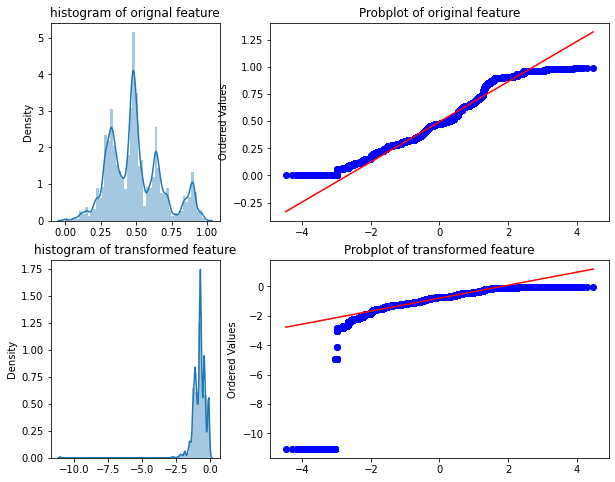



prob_plot for continous feature 2


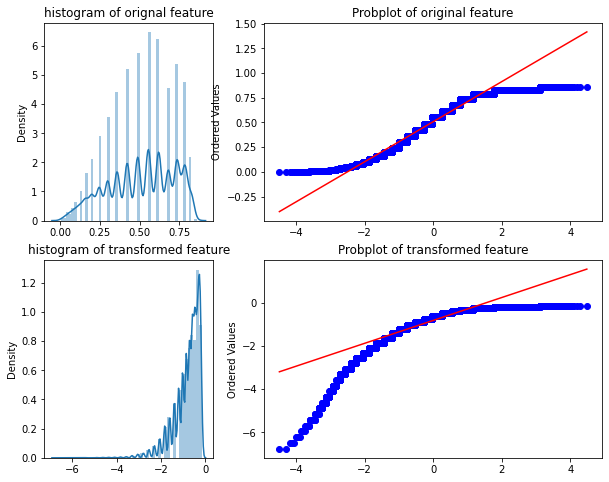



prob_plot for continous feature 3


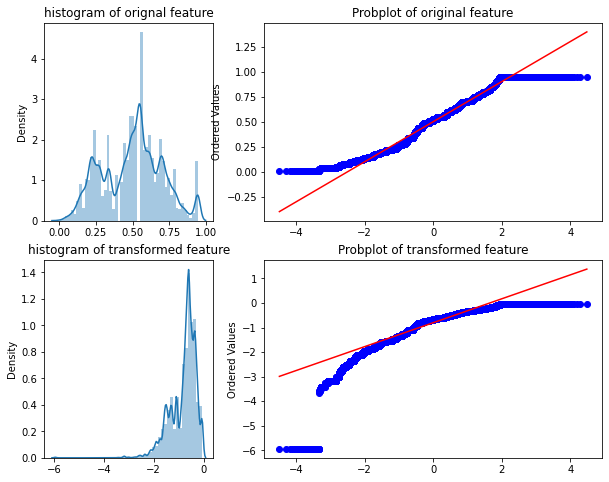



prob_plot for continous feature 4


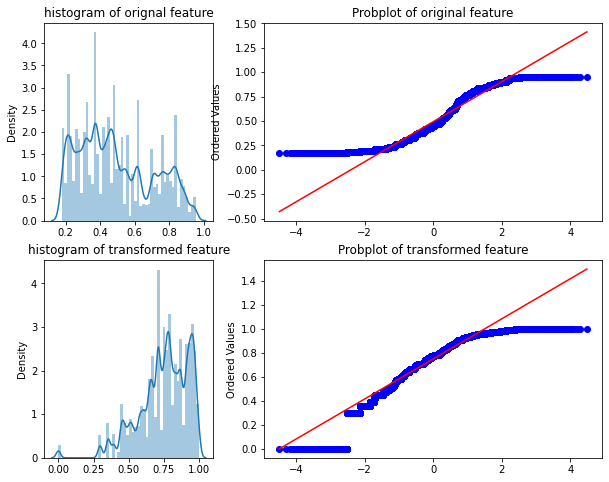



prob_plot for continous feature 5


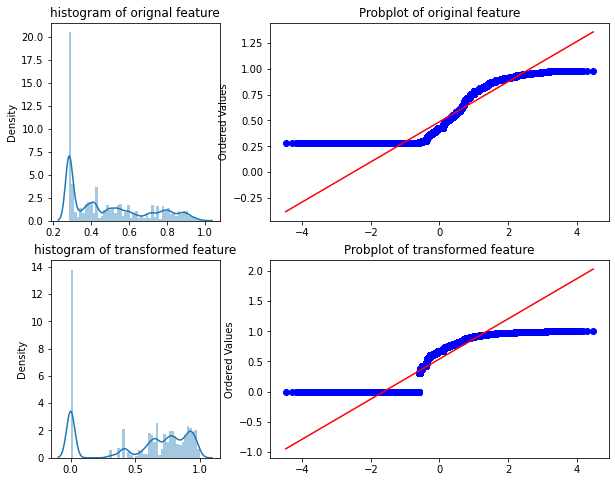



prob_plot for continous feature 6


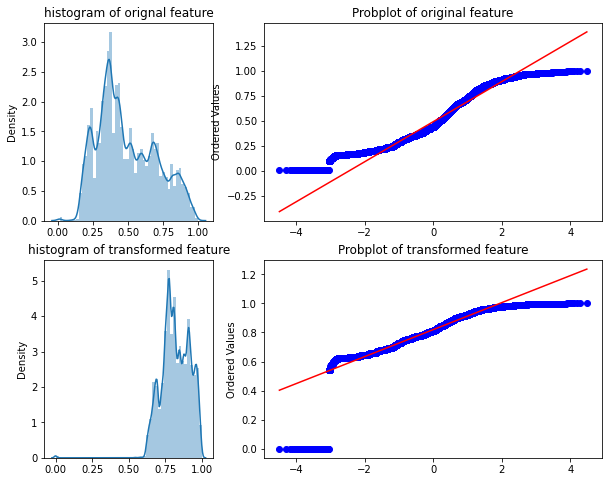



prob_plot for continous feature 7


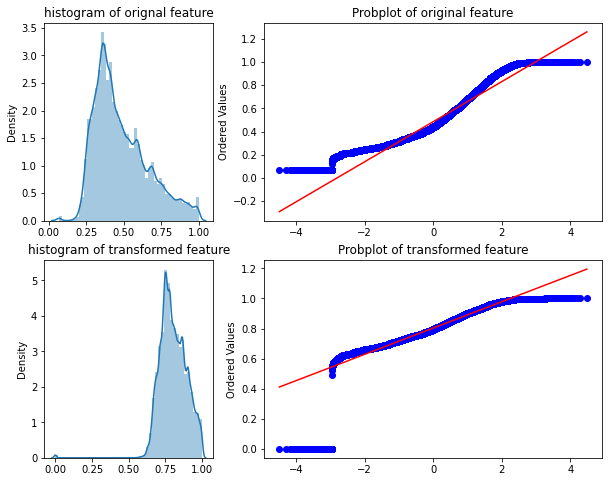



prob_plot for continous feature 8


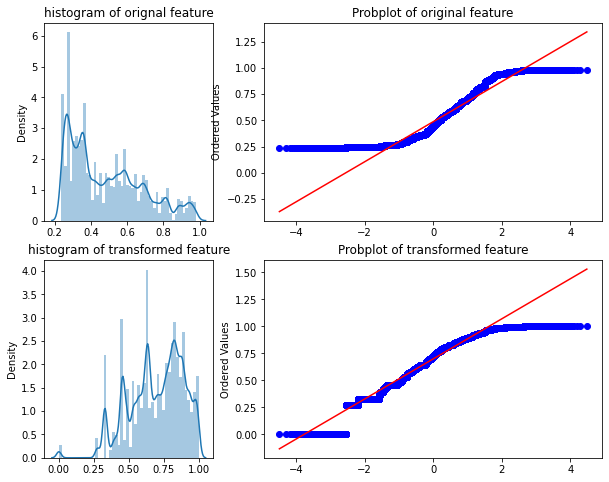



prob_plot for continous feature 9


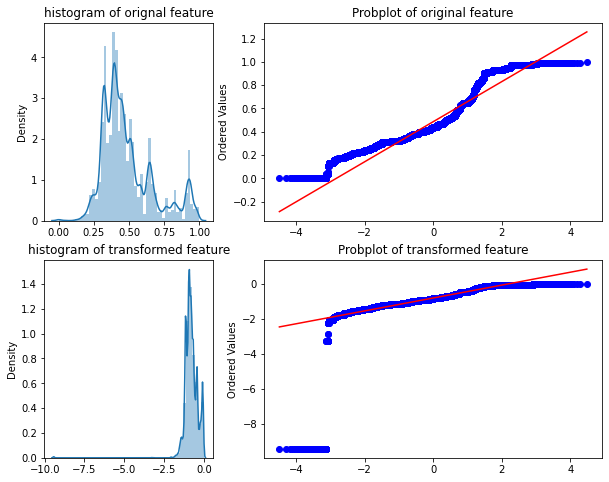



prob_plot for continous feature 10


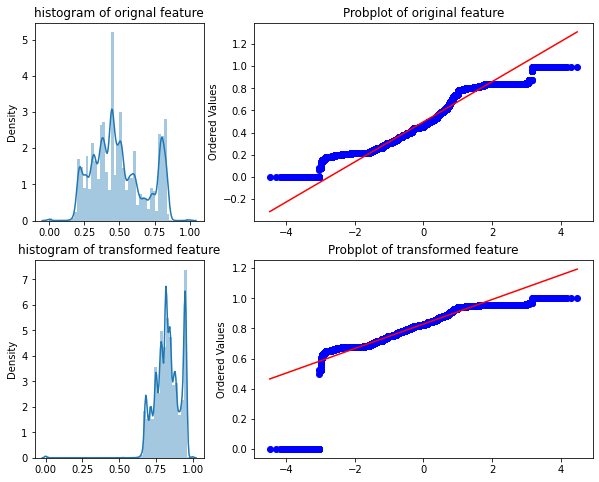



prob_plot for continous feature 11


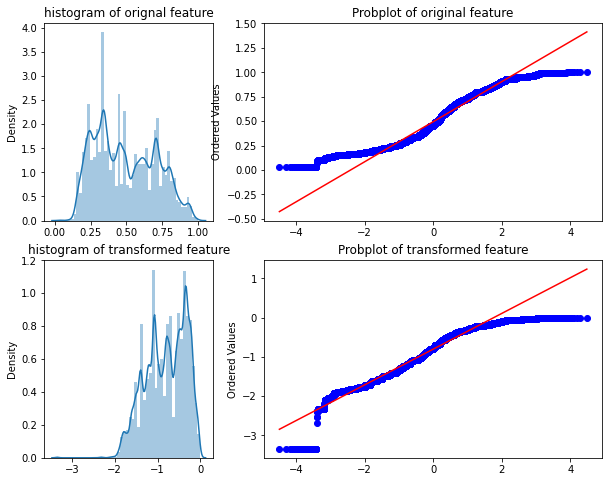



prob_plot for continous feature 12


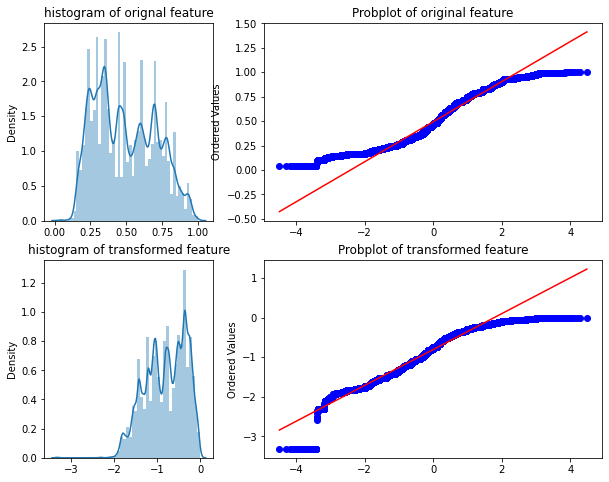



prob_plot for continous feature 13


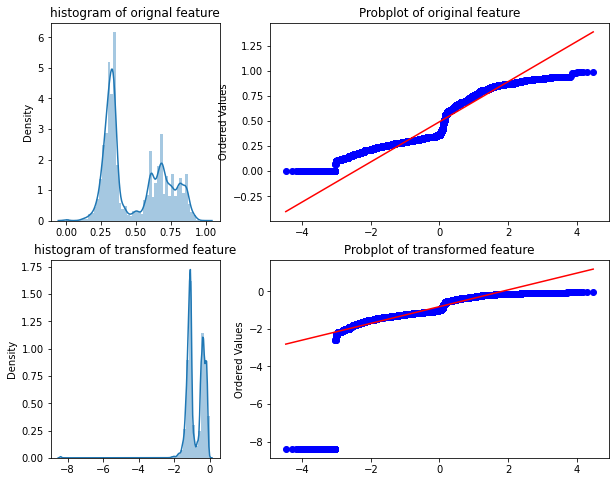



prob_plot for continous feature 14


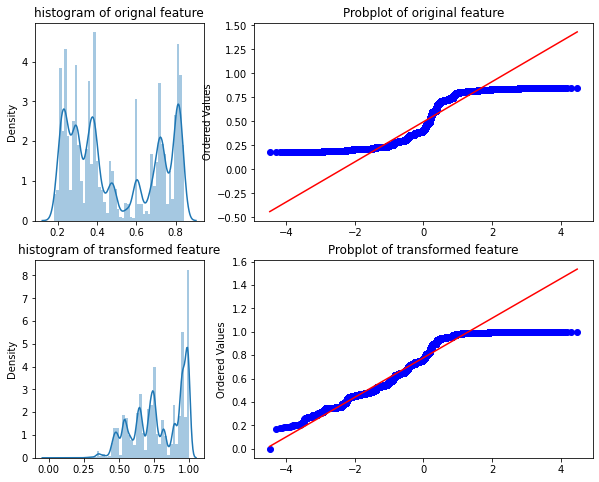

In [ ]:
print("prob_plot for continous feature 1")
prob_plot(old_features.cont1, new_features.Feature_Count1)
print("\n")
print("prob_plot for continous feature 2")
prob_plot(old_features.cont2, new_features.Feature_Count2)
print("\n")
print("prob_plot for continous feature 3")
prob_plot(old_features.cont3, new_features.Feature_Count3)
print("\n")
print("prob_plot for continous feature 4")
prob_plot(old_features.cont4, new_features.Feature_Count4)
print("\n")
print("prob_plot for continous feature 5")
prob_plot(old_features.cont5, new_features.Feature_Count5)
print("\n")
print("prob_plot for continous feature 6")
prob_plot(old_features.cont6, new_features.Feature_Count6)
print("\n")
print("prob_plot for continous feature 7")
prob_plot(old_features.cont7, new_features.Feature_Count7)
print("\n")
print("prob_plot for continous feature 8")
prob_plot(old_features.cont8, new_features.Feature_Count8)
print("\n")
print("prob_plot for continous feature 9")
prob_plot(old_features.cont9, new_features.Feature_Count9)
print("\n")
print("prob_plot for continous feature 10")
prob_plot(old_features.cont10, new_features.Feature_Count10)
print("\n")
print("prob_plot for continous feature 11")
prob_plot(old_features.cont11, new_features.Feature_Count11)
print("\n")
print("prob_plot for continous feature 12")
prob_plot(old_features.cont12, new_features.Feature_Count12)
print("\n")
print("prob_plot for continous feature 13")
prob_plot(old_features.cont13, new_features.Feature_Count13)
print("\n")
print("prob_plot for continous feature 14")
prob_plot(old_features.cont14, new_features.Feature_Count14)


All feature engineering techniques are looking alike PDF compared with non-feature engineering continous variables. 

### Feature_Engineering on Target_Feature

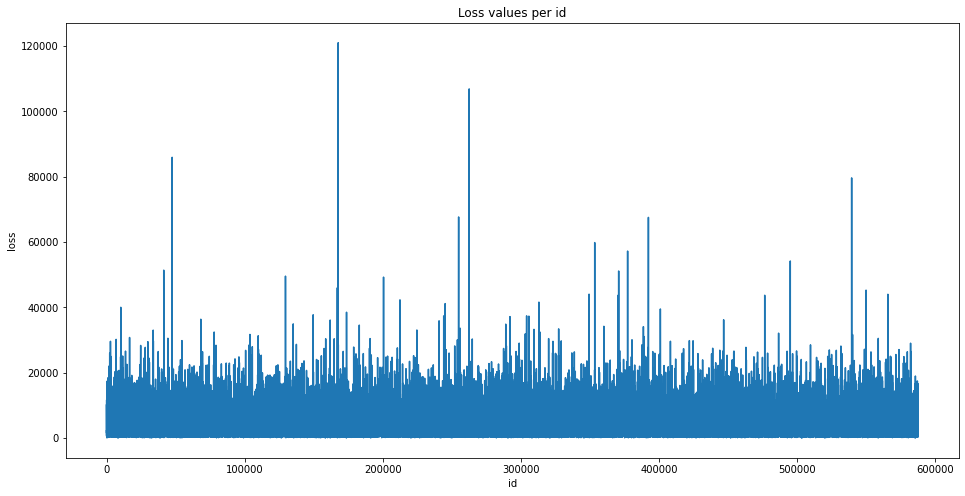

In [ ]:
"""
Loss { Target value } visulization 

"""
plt.figure(figsize=(16,8))
plt.plot(Train_Data['id'], Train_Data['loss'])
plt.title('Loss values per id')
plt.xlabel('id')
plt.ylabel('loss')
plt.show()

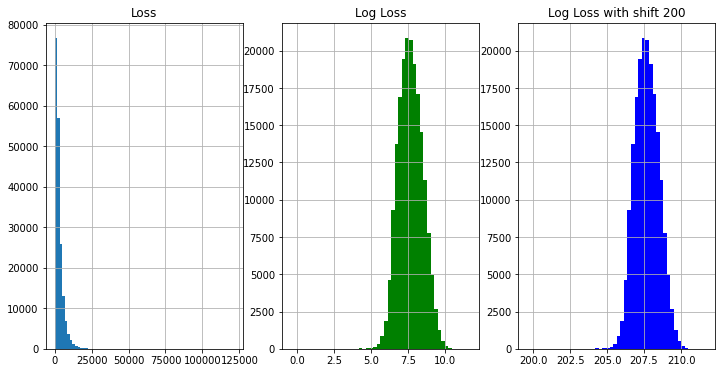

In [ ]:
"""
Plot to show the differnece of data distribution before and after log transfroamton. 

"""

import numpy as np
fig, (ax0, ax1, ax2) = plt.subplots(1,3,figsize=(12, 6))
ax0.hist(Train_Data['loss'], bins=70)
ax0.set_title('Loss')
ax0.grid(True)
ax1.hist(np.log(Train_Data['loss']), bins=50, color='g')
ax1.set_title('Log Loss')
ax1.grid(True)
ax2.hist(np.log(Train_Data['loss'])+200, bins=50, color='b')
ax2.set_title('Log Loss with shift 200')
ax2.grid(True)
plt.show()

From the above figure , we can confirm that after applying the log transform , now data seems to be normally distributed.

As we applied logarithmic function on target feature to convert it into normal distriution. We have to apply exponential function on test data while measuring / predicting  the loss 

e**y - 200 

log and log+shift (200), are almost look like PDF and less skewed. but the values are shifted / added 200 to intial value. 

If value is 1 , if shift is added , then the value will be 201.
So, best feature engineering technique is applying logarithmic function on target variable.

### Feature_Engineering_Categorical_Features

In [ ]:
Train_Data = pd.read_csv('train.csv')

In [ ]:
"""
Removing Continous , target and Id columns as we are working on only categorical features. 
"""

Train_Data.drop(columns=["id","loss","cont1", "cont2", "cont3", "cont4", "cont5", "cont6", "cont7", "cont8", "cont9", "cont10","cont11", "cont12", "cont13", "cont14"], inplace = True)

#### Encoding

In [ ]:
"""
Encoding funtion 
"""
def encode(classes):
    value = 0
    ln = len(str(classes))
    for i in range(ln):
        value += (ord(str(classes)[i]) - ord('A') + 1) * 26 ** (ln - i - 1)
    return value

Here, we are converting the alphabet to ASCII code and subtract the value with ASCII of alphabet A , which multiplied by lenght of alphabets and the final result is powered with lenght of class feature. 

I took referrence from 
https://www.kaggle.com/mariusbo/xgb-lb-1106-33084

In [ ]:
"""
Applying the encoding on all categorical feature regardless of importance.

"""
for col in Train_Data.columns.values:
  Train_Data[col] = Train_Data[col].apply(encode)

In [ ]:
"""
Saving the data frame.
"""
Train_Data.to_csv("encoding.csv",index=False)

#### Label Encoding

In [ ]:
"""
Loading training Data
Removing Continous , target and Id columns as we are working on only categorical features. 

"""
Train_Data = pd.read_csv("train.csv")
Train_Data.drop(columns=["id","loss","cont1", "cont2", "cont3", "cont4", "cont5", "cont6", "cont7", "cont8", "cont9", "cont10","cont11", "cont12", "cont13", "cont14"], inplace = True)

In [ ]:
"""
Applying label enconding on the categorical features. 
"""
for feat in Train_Data.columns:
  Train_Data[feat] = Train_Data[feat].astype('category').cat.codes

In [ ]:
"""
Saving all columns in label_list list.
"""
label_list = list(Train_Data.columns.values)

"""
Renaming all feature with suffix label_
"""
for cat in label_list:
  old_name = cat
  new_name = "label_"+cat
  Train_Data.rename(columns = {old_name:new_name},inplace=True)

In [ ]:
"""
Saving the data
"""
Train_Data.to_csv("Label Encoding.csv",index=False)

#### One Hot Encoding

In [ ]:
"""
Loading training Data
"""

Train_Data_ohe = pd.read_csv("train.csv")

In [ ]:
"""
Applying one hot encoding on categorical features 
"""

cats = [feat for feat in Train_Data_ohe.columns if 'cat' in feat]
for cat in cats:
    sorting_list=np.unique(sorted(Train_Data_ohe[cat],key=lambda x:(str.lower(x),x)))
    Train_Data_ohe[cat]=pd.Categorical(Train_Data_ohe[cat], sorting_list)
    Train_Data_ohe=Train_Data_ohe.sort_values(cat)
    Train_Data_ohe[cat] = pd.factorize(Train_Data_ohe[cat], sort=True)[0]

In [ ]:
"""
Saving all the columns and ohe_list list.
"""
ohe_list = list(Train_Data_ohe.columns.values)

"""
Renaming the columns names with suffix ohe_

"""
for cat in ohe_list:
  old_name = cat
  new_name = "ohe_"+cat
  Train_Data_ohe.rename(columns = {old_name:new_name},inplace=True)

In [ ]:
"""
Saving the data.
"""
Train_Data_ohe.to_csv("onehotencoding.csv",index=False)

In [ ]:
"""
Loading all 3 feature engineering saved data and Concatenating them
encoding, label_encoding , ohe_encoding. 

"""
encoding = pd.read_csv("encoding.csv")
label_encoding = pd.read_csv("Label Encoding.csv")
ohe_encoding = pd.read_csv("onehotencoding.csv")
result = pd.concat([encoding, label_encoding,ohe_encoding], axis=1, sort=False)

In [ ]:
"""
Removing the categorical features 
"""

features = Train_Data.columns
cats = [feat for feat in features if 'cat' in feat]
for feat in cats:
  Train_Data.drop([feat], axis=1,inplace=True)

In [ ]:
"""
Removing the continous features 
"""
con = [feat for feat in features if 'cont' in feat]
for feat in con:
  Train_Data.drop([feat], axis=1,inplace=True)

In [ ]:
"""
Removing the id column 
"""

Train_Data.drop(["id"], axis=1,inplace=True)

In [ ]:
"""
Concatenating the final data frame with target value to biuld a model.
"""
Final_Data =  pd.concat([result, Train_Data], axis=1, sort=False)

In [ ]:
Final_Data.head()

,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,...,ohe_cat93,ohe_cat94,ohe_cat95,ohe_cat96,ohe_cat97,ohe_cat98,ohe_cat99,ohe_cat100,ohe_cat101,ohe_cat102,ohe_cat103,ohe_cat104,ohe_cat105,ohe_cat106,ohe_cat107,ohe_cat108,ohe_cat109,ohe_cat110,ohe_cat111,ohe_cat112,ohe_cat113,ohe_cat114,ohe_cat115,ohe_cat116,ohe_cont1,ohe_cont2,ohe_cont3,ohe_cont4,ohe_cont5,ohe_cont6,ohe_cont7,ohe_cont8,ohe_cont9,ohe_cont10,ohe_cont11,ohe_cont12,ohe_cont13,ohe_cont14,ohe_loss,loss
0,1,2,1,2,1,1,1,1,2,1,2,1,1,1,1,1,1,1,1,1,1,1,2,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,...,3,3,0,4,2,0,2,5,6,0,0,11,14,3,4,7,33,3,0,31,19,0,7,0,0.327952,0.488789,0.944251,0.503820,0.543117,0.604910,0.998710,0.50060,0.28066,0.43919,0.997796,0.997376,0.169853,0.741150,9949.54,2213.18
1,1,2,1,1,1,1,1,1,2,2,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,...,2,3,0,4,2,0,2,6,8,0,0,11,14,3,4,7,33,3,0,8,19,0,7,0,0.327952,0.488789,0.944251,0.503820,0.543117,0.604910,0.998710,0.50060,0.28066,0.43919,0.997796,0.997376,0.169853,0.232245,17764.40,1283.60
2,1,2,1,1,2,1,1,1,2,2,2,2,2,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,2,1,1,1,1,...,3,3,3,4,6,0,12,5,2,0,0,11,13,4,4,3,33,60,0,30,19,0,9,0,0.694098,0.555782,0.944251,0.503820,0.543117,0.710207,0.997553,0.48266,0.74247,0.56081,0.997796,0.997376,0.342239,0.811204,2605.78,3005.09
3,2,2,1,2,1,1,1,1,2,1,1,1,1,1,1,1,1,1,1,1,1,1,2,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,...,3,3,2,4,0,0,1,7,12,0,2,11,14,4,4,3,33,60,2,39,19,0,8,0,0.579473,0.422197,0.944251,0.503820,0.543117,0.610518,0.998825,0.53046,0.53356,0.52775,0.997796,0.997376,0.268941,0.599345,11475.22,939.85
4,1,2,1,2,1,1,1,1,2,2,1,2,1,1,1,1,1,1,1,1,1,1,2,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,...,3,4,2,4,4,0,0,5,3,0,0,2,4,7,5,7,69,44,2,16,18,0,8,1,0.228606,0.012775,0.944251,0.189137,0.281143,0.239426,0.342311,0.30768,0.20266,0.20496,0.263154,0.258859,0.148468,0.357614,1521.70,2763.85


In [ ]:
"""
Dividing the data into X anf y for training. 
"""
X = Final_Data.drop(["loss"], axis= 1)
y = Final_Data["loss"]

In [ ]:
"""
Building a model with Random Forest to extract important features. 

"""
Final_RF = RandomForestRegressor(bootstrap = True, max_depth = 10, min_samples_leaf = 4, min_samples_split = 2,max_features=0.2)
Final_RF.fit(X,y)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=10, max_features=0.2, max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=4,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [ ]:
"""
Function to retun important feature with values in form of Data Frame. 
"""
best_features = Final_RF.feature_importances_
def get_feature_importance_df(feature_importances,column_names):
  imp_dict = dict(zip(column_names, feature_importances))
  features = sorted(imp_dict, key=imp_dict.get, reverse=True)
  importances = [imp_dict[feature] for feature in features]
  df = pd.DataFrame(data={'feature': features, 'importance': importances})
  return df

In [ ]:
"""
Saving the returned dataframe into feature_importance variable. 

"""

features = Final_Data.columns.values
feature_importance = get_feature_importance_df(best_features, features)

In [ ]:
feature_importance.head(50)

,feature,importance
0,label_cat80,0.143814
1,cat80,0.126787
2,cat79,0.088705
3,label_cat79,0.068175
4,cat57,0.041845
5,label_cat57,0.033032
6,label_cat87,0.032191
7,cat87,0.031713
8,cat12,0.026350
9,label_cat101,0.022924


From the top 50 important features, we can observe that label encoding and encoding function feature are more imprtant than the one hot encoding. 

So, here we can do trail and error method with different algorithms and different encoding techniques. 

**Is train and test datasets are identical ?**


In [6]:
""" Checking the columns are identical or not in Train and Test data """

train_features = list(Train_Data.columns.values) 
train_features.pop() #pop out the loss column 
test_features = list(Test_Data.columns.values) 
print('Is train and test datasets are identical ? ' + str(train_features == test_features))


Is train and test datasets are identical ? True


**Classes missing in train / test datasets**


In [9]:
Train_Data.drop(columns=['id','cont1','cont2','cont3','cont4','cont5','cont6','cont7','cont8','cont9','cont10','cont11','cont12','cont13','cont14','loss'], inplace = True)
Test_Data.drop(["id"], axis=1,inplace=True)

In [10]:
""" 
Retriving the missing classes from Train and Test Datasets.
"""

Train_Data_classes_missing = {}
Test_Data_classes_missing = {}
for column in Train_Data.columns.values:
  if Train_Data[column].nunique() != Test_Data[column].nunique():
    Unique_classes_Train = set(Train_Data[column].unique())    
    Unique_classes_Test = set(Test_Data[column].unique())    
    Train_Data_classes_missing[column] = list(Unique_classes_Train.difference(Unique_classes_Test)) 

  if Test_Data[column].nunique() != Train_Data[column].nunique():    
    Unique_classes_Train = set(Train_Data[column].unique())    
    Unique_classes_Test = set(Test_Data[column].unique())    
    Test_Data_classes_missing[column] = list(Unique_classes_Test.difference(Unique_classes_Train))


In [11]:
Class_missing_Train = pd.DataFrame(list(Train_Data_classes_missing.items()),columns = ['Feature',' missing']) 
Class_missing_Test  = pd.DataFrame(list(Test_Data_classes_missing.items()),columns = ['Feature','m issing'])


In [12]:
Class_missing_Train

,Feature,missing
0,cat90,[G]
1,cat92,[F]
2,cat96,[]
3,cat99,[]
4,cat101,"[N, U]"
5,cat102,"[J, H]"
6,cat103,[]
7,cat105,"[R, S]"
8,cat106,[]
9,cat109,"[BF, B, AK, BY, BT, J, BM, BV, AG, BP, CJ]"


In [13]:
Class_missing_Test

,Feature,m issing
0,cat90,[]
1,cat92,"[G, E]"
2,cat96,[H]
3,cat99,[U]
4,cat101,[]
5,cat102,[]
6,cat103,[M]
7,cat105,[]
8,cat106,[Q]
9,cat109,[AD]


From the above table we can observe that there are few classes which are present in Train data but missing in Test data and vice versa

<h1>4. Takeways</h1>

1.	We have index range from 0 to 188317 (188318 observations) and 132 features, from id to loss. From the info out of 132 features, 116 are categorical, 15 are continuous and 1 ID columns.
2.	The continuous variables have already been scaled into the interval [0,1] and all have a mean of 0.5 (nearly)
3.	There are no missing values and duplicate as well.
4.	Continuous variable 2 and 3 are left skewed (Cont3 not skewed much ~ 0) Cont9 ( 1.0 + )variable is more skewed compared to other continuous variables Target variable is highly skewed.
5.	There are many spikes in the continuous which shows that features are not distributed normally. We try transforming these features making their distribution more gaussian, but it might not improve the model's performance
6.	After applying the log transform, target feature is transformed to normally distributed
7.	We see a high correlation on below listed features.
 	cont11 and cont12 give an almost linear pattern...one must be removed 
 	ont1 and cont9 are highly correlated ...either of them could be safely removed 
 	cont6 and cont10 show very good correlation too 

8.	This may be a result of a data-based multicollinearity as two or more predictors are highly correlated. There are many problems it causes, so we should be very careful while implementing linear regression models on current dataset.
 	Cat1 to cat72 have only two classes A and B. In most of the cases, B has very few entries 2. 
 	Cat73 to cat 108 have more than two classes 3. 
 	Cat109 to cat116 have many classes 4. 
 	Cat115 and Cat116 have more than 100 classes
9.	Top 10 important features are cat80, cat79, cat57, cat101, cat87, cat81, cat12, cat89, cat106, cat7.
10.	Categorical features with two classes are less important and that too in a categorical feature where the count of class A very high {B can negligibly compare with A} is not an important feature.
11.	Label encoding and manual encoding techniques works better for categorical features. 
12.	Log and minmax techniques work better on continuous features. 
13.	Applying log transformation is better technique on target value. 
